In [1]:
import glob
import os
import pickle
import random
import sys

import matplotlib as mpl
import matplotlib.pyplot as plt
import mdtraj as md
import numpy as np
import pymbar
import scipy
import seaborn as sns
from matplotlib import ticker
from pymbar import timeseries
from sklearn.cluster import MiniBatchKMeans
from sklearn.neighbors import NearestNeighbors

import extq
import prettypyplot as pplt

Warning on use of the timeseries module: If the inherent timescales of the system are long compared to those being analyzed, this statistical inefficiency may be an underestimate.  The estimate presumes the use of many statistically independent samples.  Tests should be performed to assess whether this condition is satisfied.   Be cautious in the interpretation of the data.

****** PyMBAR will use 64-bit JAX! *******
* JAX is currently set to 32-bit bitsize *
* which is its default.                  *
*                                        *
* PyMBAR requires 64-bit mode and WILL   *
* enable JAX's 64-bit mode when called.  *
*                                        *
* This MAY cause problems with other     *
* Uses of JAX in the same code.          *
******************************************



In [2]:
! source /project/dinner/scguo/upside2/sourceme.sh

In [3]:
# upside_path = os.environ["UPSIDE_HOME"]
upside_path = "/project/dinner/scguo/upside2/"
upside_utils_dir = os.path.expanduser(upside_path + "/py")
sys.path.insert(0, upside_utils_dir)

In [4]:
plt.style.use("custom")  # custom style sheet
plt.style.use("vibrant")  # muted color theme from SciencePlots
pplt.load_cmaps()

In [5]:
plt.rcParams[
    "text.latex.preamble"
] = r"\usepackage{siunitx}\sisetup{detect-all}\usepackage{helvet}\usepackage{sansmath}\sansmath"
mpl.rcParams["font.family"] = "sans-serif"
mpl.rcParams["font.sans-serif"] = "cm"

# Load data

In [6]:
n_rep = 48  # replica number

output_names = [
    "gs_d91r",
    "fs_d91r",
    "d91r_05_31",
    "d91r_06_00",
    "remd_d91r_06_00_23_34423",
    "remd_d91r_06_00_19_42383",
    "remd_d91r_06_00_21_33547",
    "remd_d91r_06_00_25_30869",
]
output_dirs = ["gs_p2.5", "fs_p2.5", "05_31", "06_00", "rerun_0", "rerun_1", "rerun_2", "rerun_3"]
work_dir = "/project/dinner/scguo/kaiB/remd/d91r_iso"

In [7]:
# try to estimate timeseries correlation
# for d, n in zip(output_dirs, output_names):
#     test_pot_traj = np.load(f"{work_dir}/{d}/outputs/{n}.run.00_Energy.npy")[:, 0]
#     t0, g, Neff = timeseries.detect_equilibration(test_pot_traj)
#     print(f"{t0=}, {g=}, {Neff=}")

In [8]:
# try to estimate timeseries correlation
# for d, n in zip(output_dirs, output_names):
#     test_pot_traj = np.load(f"{work_dir}/{d}/outputs/{n}.run.01_Energy.npy")[:, 0]
#     t0, g, Neff = timeseries.detect_equilibration(test_pot_traj)
#     print(f"{t0=}, {g=}, {Neff=}")

In [9]:
# try to estimate timeseries correlation
# for d, n in zip(output_dirs, output_names):
#     test_pot_trajs = []
#     for i in range(n_rep):
#         test_pot_trajs.append(np.load(f"{work_dir}/{d}/outputs/{n}.run.{i:02}_Energy.npy")[:, 0])
    # g = timeseries.statistical_inefficiency_multiple(test_pot_trajs)
#     print(f"{g=}")

In [10]:
pot, hb, Ts, T, rgs = [], [], [], [], []
start_frame = 10000  # skip first _ frames
end_frame = 42000
skip = 1  #

for i in range(n_rep):
    j = str(i).zfill(2)
    pot_arrays, hb_arrays, rg_arrays = [], [], []
    for d, n in zip(output_dirs, output_names):
        pot_arrays.append(
            np.load(f"{work_dir}/{d}/outputs/{n}.run.{j}_Energy.npy")[start_frame:end_frame:skip, 0]
        )
        hb_arrays.append(
            np.load(f"{work_dir}/{d}/outputs/{n}.run.{j}_Hbond.npy")[start_frame:end_frame:skip]
        )
        rg_arrays.append(np.load(f"{work_dir}/{d}/outputs/{n}.run.{j}_Rg.npy")[start_frame:end_frame:skip])

    pot.append(np.concatenate(pot_arrays))
    hb.append(np.concatenate(hb_arrays))
    rgs.append(np.concatenate(rg_arrays))
    t = np.load(f"{work_dir}/{output_dirs[0]}/outputs/{output_names[0]}.run.{j}_T.npy")
    nsize = pot[0].size
    Ts.append(np.zeros(nsize) + t)
    T.append(t)

pot = np.array(pot)
hb = np.array(hb)
rgs = np.array(rgs)
Ts = np.array(Ts)
T = np.array(T)

print(pot.shape, hb.shape, rgs.shape, Ts.shape, T.shape)

(48, 256000) (48, 256000) (48, 256000) (48, 256000) (48,)


In [11]:
print([arr.shape for arr in pot_arrays])

[(32000,), (32000,), (32000,), (32000,), (32000,), (32000,), (32000,), (32000,)]


## weights using MBAR

In [12]:
kB = 1.0  # upside unit
beta = 1 / (kB * T)

nsamples = pot.shape[-1]
nsamples_arr = np.zeros([n_rep], np.int32) + len(pot[0])
reduced_pot = np.zeros([n_rep, n_rep, nsamples], np.float32)
for k in range(n_rep):
    for l in range(n_rep):
        reduced_pot[k, l] = beta[l] * pot[k]

In [13]:
reduced_pot.shape

(48, 48, 256000)

In [14]:
mbar = pymbar.MBAR(reduced_pot, nsamples_arr, verbose=True)


******* JAX 64-bit mode is now on! *******
*     JAX is now set to 64-bit mode!     *
*   This MAY cause problems with other   *
*      uses of JAX in the same code.     *
******************************************

No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)
Failed to reach a solution to within tolerance with hybr: trying next method


## Calculate melting curve using $R_g$ and hydrogen bonds

In [15]:
rg_reweight = mbar.compute_expectations(rgs)
hb_reweight = mbar.compute_expectations(hb)

/beagle3/dinner/scguo/envs/md/lib/python3.11/site-packages/pymbar/mbar.py:935: RuntimeWarning: divide by zero encountered in log
  Log_W_nk[:, sa] = np.log(A_n[i, ri]) + Log_W_nk[:, l]


/project/dinner/scguo/prettypyplot/src/prettypyplot/pyplot.py:241: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  leg = ax.legend(handles, labels, *args, **kwargs)


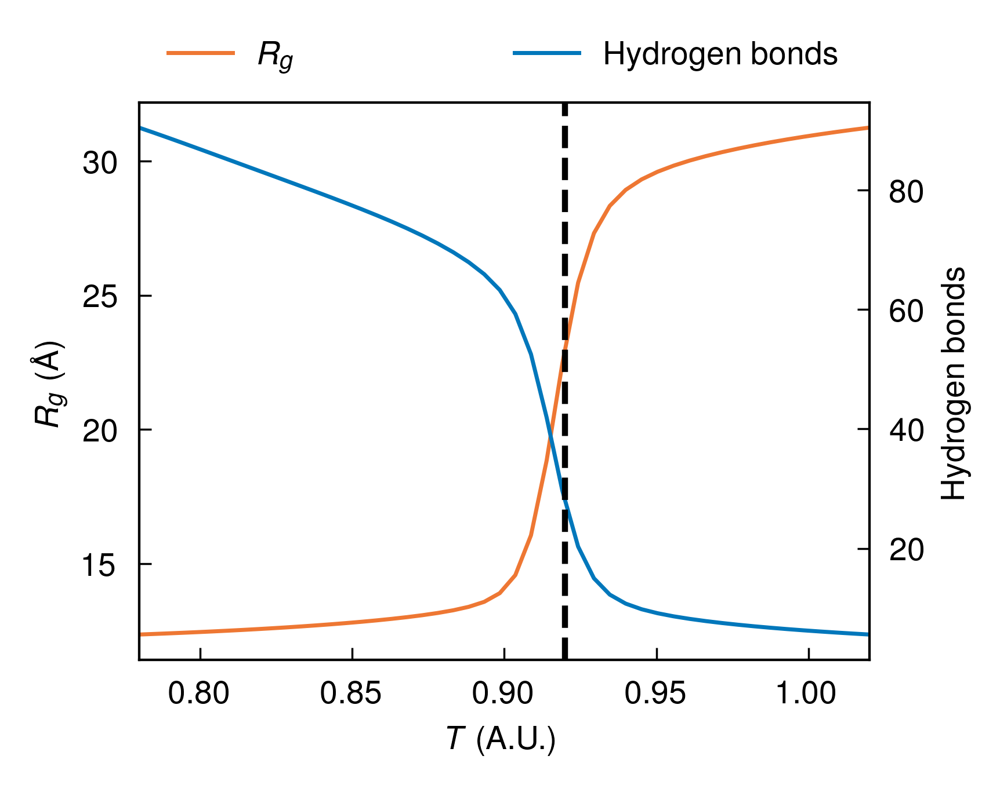

In [16]:
fig = plt.figure(figsize=(3.25, 2.5), dpi=500)
ax = plt.gca()
(line1,) = ax.plot(T, rg_reweight["mu"], color="C0", label="$R_g$", lw=1.0)
ax.set_ylabel("$R_g$ (Å)")
ax2 = plt.twinx()
(line2,) = ax2.plot(T, hb_reweight["mu"], color="C1", label="Hydrogen bonds", lw=1.0)
ax2.set_ylabel("Hydrogen bonds")
ax.set_xlabel("$T$ (A.U.)")
ax2.axvline(0.92, ls="--", color="k", lw=1.5, zorder=5)
ax.set_xlim([T[0], T[-1]])

pplt.legend(outside="top", ncol=2, handles=[line1, line2])
# plt.savefig("../../dga/figures/remd_dga_tmelt.png", bbox_inches='tight')

# Compute PMF

In [17]:
heads = [
    "gs_p2.5_gs_p2.5",
    "fs_p2.5_fs_p2.5",
    "05_31_05_31",
    "06_00_06_00",
    "rerun_0_rerun_0",
    "rerun_1_rerun_1",
    "rerun_2_rerun_2",
    "rerun_3_rerun_3",
]

In [18]:
def load_cvs():
    raw_feats, fs_qtots, f_rmsds, p_rmsds, r_rmsds = [], [], [], [], []
    for d, head in zip(output_dirs, heads):
        raw_feats.extend(np.load(f"{work_dir}/{d}/outputs/{head}_raw_feats.pkl", allow_pickle=True))
        fs_qtots.extend(np.load(f"{work_dir}/{d}/outputs/{head}_fs_qtots.pkl", allow_pickle=True))
        f_rmsds.extend(np.load(f"{work_dir}/{d}/outputs/{head}_f_rmsds.pkl", allow_pickle=True))
        p_rmsds.extend(np.load(f"{work_dir}/{d}/outputs/{head}_p_rmsds.pkl", allow_pickle=True))
        r_rmsds.extend(np.load(f"{work_dir}/{d}/outputs/{head}_r_rmsds.pkl", allow_pickle=True))
    raw_feats = [traj[start_frame:end_frame:skip] for traj in raw_feats]
    fs_qtots = [traj[:, start_frame:end_frame:skip] for traj in fs_qtots]
    f_rmsds = [traj[start_frame:end_frame:skip] for traj in f_rmsds]
    r_rmsds = [traj[start_frame:end_frame:skip] for traj in r_rmsds]
    p_rmsds = [traj[start_frame:end_frame:skip] for traj in p_rmsds]

    return raw_feats, fs_qtots, f_rmsds, p_rmsds, r_rmsds

In [19]:
_, fs_qtots, f_rmsds, p_rmsds, r_rmsds = load_cvs()

In [20]:
# Adam's CVs
c_gsa1 = np.concatenate([traj[1, :] for traj in fs_qtots])
c_gsa2 = np.concatenate([traj[3, :] for traj in fs_qtots])
c_gsb2 = np.concatenate([traj[5, :] for traj in fs_qtots])

c_fsb1 = np.concatenate([traj[0, :] for traj in fs_qtots])
c_fsb2 = np.concatenate([traj[2, :] for traj in fs_qtots])
c_fsa2 = np.concatenate([traj[4, :] for traj in fs_qtots])

c_green_arr = c_gsa2 - c_fsb2
c_blue_arr = c_gsb2 - c_fsa2
c_orange_arr = c_gsa1 - c_fsb1

c_green = [traj[3, :] - traj[2, :] for traj in fs_qtots]
c_blue = [traj[5, :] - traj[4, :] for traj in fs_qtots]
c_orange = [traj[1, :] - traj[0, :] for traj in fs_qtots]

In [21]:
def reweight(T_test):
    beta_test = 1 / (kB * T_test)
    log_w_nb = mbar._computeUnnormalizedLogWeights(
        np.ravel(beta_test * pot)
    )  # compute free energy at T_test
    max_log_w_nb = np.max(log_w_nb)  # to prevent underflow.
    w_nb = np.exp(log_w_nb - max_log_w_nb)
    return w_nb

In [22]:
def split_indices(arrays):
    """Gets the indices for np.split from a
    list of arrays.

    Parameters
    ----------
    arrays : ndarray or list/tuple of ndarray
        Arrays from which to get indices

    Returns
    -------
    traj_inds : list of int
        Frame separators to use in np.split
    """
    traj_lens = [len(traj) for traj in arrays]
    traj_inds = []
    subtot = 0
    for length in traj_lens[:-1]:
        subtot += length
        traj_inds.append(subtot)
    return traj_inds

In [23]:
traj_inds = split_indices(c_green)

/scratch/local/jobs/15563240/ipykernel_2293276/2410030246.py:14: RuntimeWarning: divide by zero encountered in log
  offset = np.min(-np.log(hist))
/scratch/local/jobs/15563240/ipykernel_2293276/2410030246.py:15: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(hist) - offset


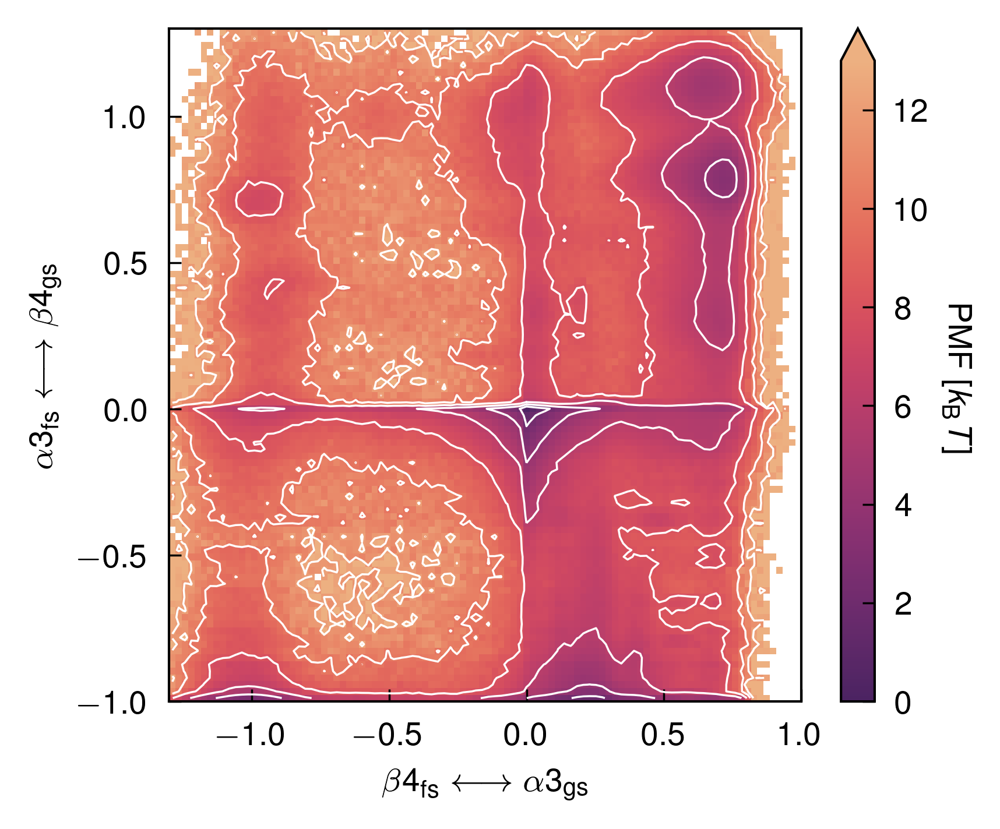

In [24]:
fig, ax = plt.subplots(figsize=(3.5, 3), dpi=500)

xe = np.linspace(-1.3, 1, 101)
ye = np.linspace(-1, 1.3, 101)
xc = (xe[1:] + xe[:-1]) / 2
yc = (ye[1:] + ye[:-1]) / 2
clines = np.arange(0, 13, 2)

cv1_delay = [t for t in c_green]
cv2_delay = [t for t in c_blue]

w_nb = np.split(reweight(0.87), traj_inds)
hist = extq.projection.density2d(cv1_delay, cv2_delay, w_nb, xe, ye)
offset = np.min(-np.log(hist))
pmf = -np.log(hist) - offset
pc = ax.pcolormesh(xc, yc, pmf.T, vmax=13, cmap="flare_r", rasterized=True)
ax.contour(xc, yc, pmf.T, colors="white", levels=clines, linewidths=0.5)
ax.set_ylabel(r"$\alpha3_{\mathrm{fs}}\longleftrightarrow \beta4_{\mathrm{gs}}$")
ax.set_xlabel(r"$\beta4_{\mathrm{fs}}\longleftrightarrow\alpha3_{\mathrm{gs}}$")
# ax.set_title(f"$\\tau$ = {lagtime}")
ax.label_outer()
cb = plt.colorbar(pc, ax=ax, extend="max")
cb.set_label(r"PMF [$k_{\mathrm{B}}T$]", rotation=-90, labelpad=10)

/scratch/local/jobs/15563240/ipykernel_2293276/2410030246.py:14: RuntimeWarning: divide by zero encountered in log
  offset = np.min(-np.log(hist))
/scratch/local/jobs/15563240/ipykernel_2293276/2410030246.py:15: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(hist) - offset


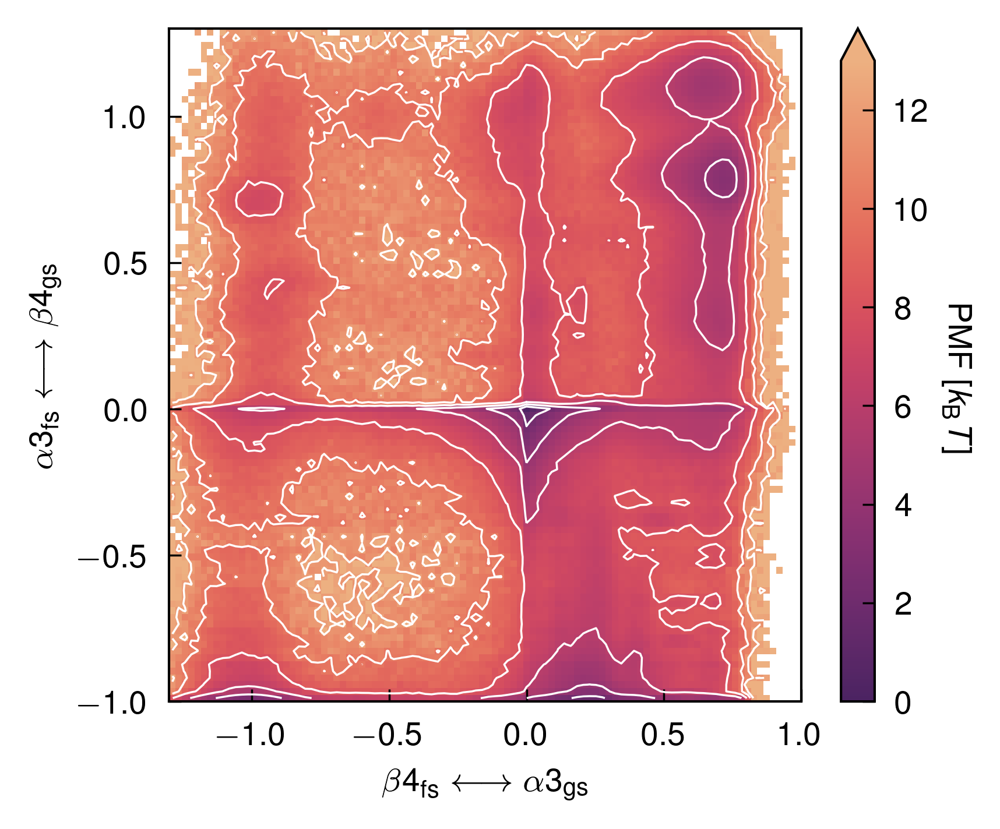

In [25]:
fig, ax = plt.subplots(figsize=(3.5, 3), dpi=500)

xe = np.linspace(-1.3, 1, 101)
ye = np.linspace(-1, 1.3, 101)
xc = (xe[1:] + xe[:-1]) / 2
yc = (ye[1:] + ye[:-1]) / 2
clines = np.arange(0, 13, 2)

cv1_delay = [t for t in c_green]
cv2_delay = [t for t in c_blue]

w_nb = np.split(reweight(0.87), traj_inds)
hist = extq.projection.density2d(cv1_delay, cv2_delay, w_nb, xe, ye)
offset = np.min(-np.log(hist))
pmf = -np.log(hist) - offset
pc = ax.pcolormesh(xc, yc, pmf.T, vmax=13, cmap="flare_r", rasterized=True)
ax.contour(xc, yc, pmf.T, colors="white", levels=clines, linewidths=0.5)
ax.set_ylabel(r"$\alpha3_{\mathrm{fs}}\longleftrightarrow \beta4_{\mathrm{gs}}$")
ax.set_xlabel(r"$\beta4_{\mathrm{fs}}\longleftrightarrow\alpha3_{\mathrm{gs}}$")
# ax.set_title(f"$\\tau$ = {lagtime}")
ax.label_outer()
cb = plt.colorbar(pc, ax=ax, extend="max")
cb.set_label(r"PMF [$k_{\mathrm{B}}T$]", rotation=-90, labelpad=10)

In [26]:
labels = dict(
    blue=r"$\alpha3_{\mathrm{fs}}\longleftrightarrow \beta4_{\mathrm{gs}}$",
    green=r"$\beta4_{\mathrm{fs}}\longleftrightarrow\alpha3_{\mathrm{gs}}$",
    orange=r"$\beta3_{\mathrm{fs}}\longleftrightarrow\alpha2_{\mathrm{gs}}$",
)

/scratch/local/jobs/15563240/ipykernel_2293276/1787846287.py:14: RuntimeWarning: divide by zero encountered in log
  offset = np.min(-np.log(hist))
/scratch/local/jobs/15563240/ipykernel_2293276/1787846287.py:15: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(hist) - offset


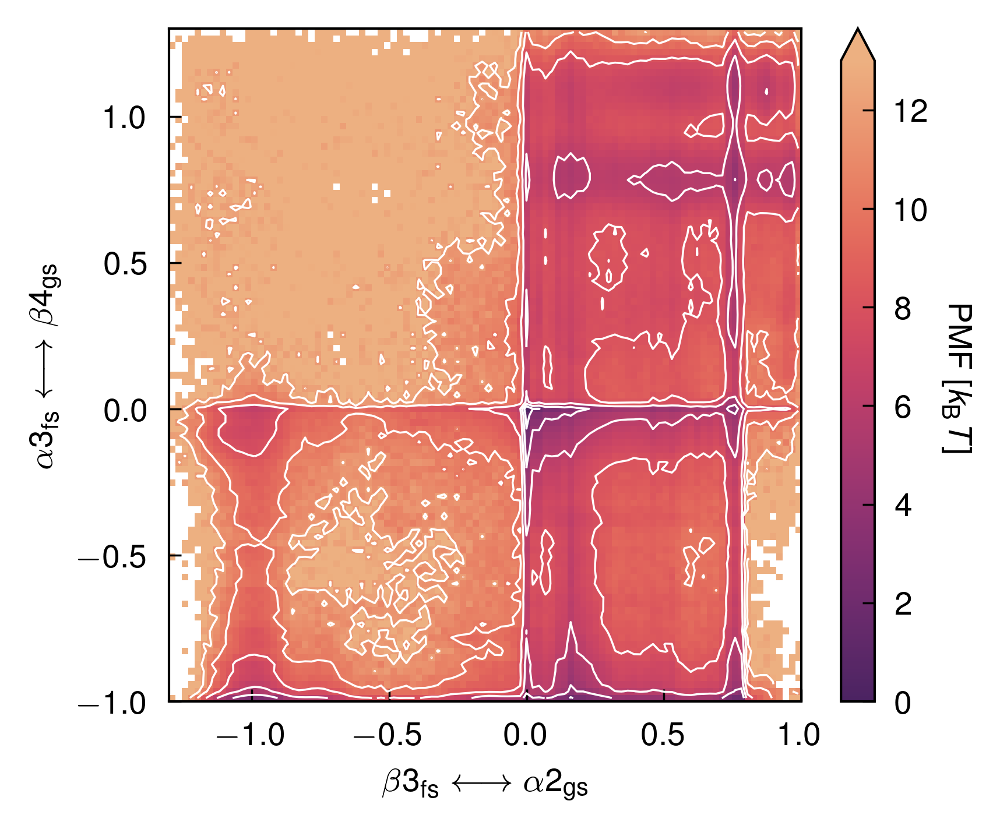

In [27]:
fig, ax = plt.subplots(figsize=(3.5, 3), dpi=500)

xe = np.linspace(-1.3, 1, 101)
ye = np.linspace(-1, 1.3, 101)
xc = (xe[1:] + xe[:-1]) / 2
yc = (ye[1:] + ye[:-1]) / 2
clines = np.arange(0, 13, 2)

cv1_delay = [t for t in c_orange]
cv2_delay = [t for t in c_blue]

w_nb = np.split(reweight(0.87), traj_inds)
hist = extq.projection.density2d(cv1_delay, cv2_delay, w_nb, xe, ye)
offset = np.min(-np.log(hist))
pmf = -np.log(hist) - offset

pc = ax.pcolormesh(xc, yc, pmf.T, vmax=13, cmap="flare_r", rasterized=True)
ax.contour(xc, yc, pmf.T, colors="white", levels=clines, linewidths=0.5)
# for i in range(143, 239, 24):
#     ax.plot(c_green[i][:100], c_blue[i][:100], '.', lw=0.5, alpha=0.75)
ax.set_xlabel(labels["orange"])
ax.set_ylabel(labels["blue"])
# ax.set_title(f"$\\tau$ = {lagtime}")
ax.label_outer()
cb = plt.colorbar(pc, ax=ax, extend="max")
cb.set_label(r"PMF [$k_{\mathrm{B}}T$]", rotation=-90, labelpad=10)

/scratch/local/jobs/15563240/ipykernel_2293276/1010456598.py:14: RuntimeWarning: divide by zero encountered in log
  offset = np.min(-np.log(hist))
/scratch/local/jobs/15563240/ipykernel_2293276/1010456598.py:15: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(hist) - offset


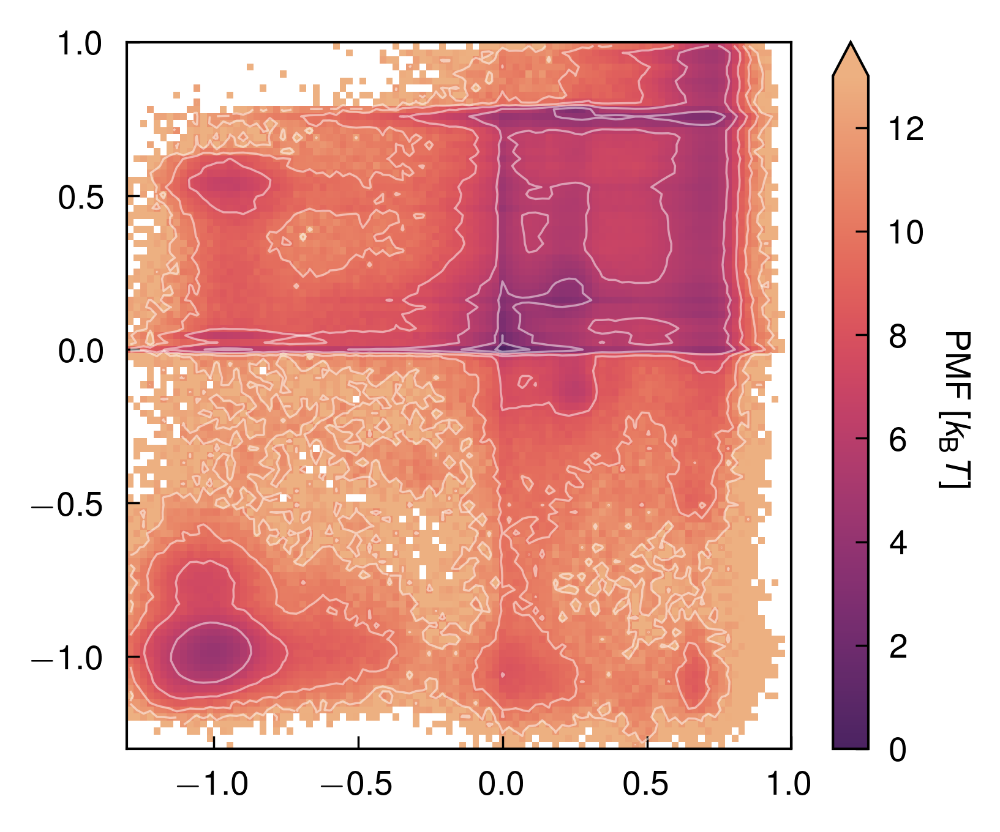

In [28]:
fig, ax = plt.subplots(figsize=(3.5, 3), dpi=500)

xe = np.linspace(-1.3, 1, 101)
ye = np.linspace(-1.3, 1, 101)
xc = (xe[1:] + xe[:-1]) / 2
yc = (ye[1:] + ye[:-1]) / 2
clines = np.arange(0, 13, 2)

cv1_delay = [t for t in c_green]
cv2_delay = [t for t in c_orange]

w_nb = np.split(reweight(0.87), traj_inds)
hist = extq.projection.density2d(cv1_delay, cv2_delay, w_nb, xe, ye)
offset = np.min(-np.log(hist))
pmf = -np.log(hist) - offset

pc = ax.pcolormesh(xc, yc, pmf.T, vmax=13, cmap="flare_r", rasterized=True)
ax.contour(xc, yc, pmf.T, colors="white", levels=clines, linewidths=0.5, alpha=0.5)
# for i in range(143, 239, 24):
#     ax.plot(c_green[i][:100], c_blue[i][:100], '.', lw=0.5, alpha=0.75)
# ax.set_ylabel(r"$\alpha3_{\mathrm{fs}}\longleftrightarrow \beta4_{\mathrm{gs}}$")
# ax.set_xlabel(r"$\beta4_{\mathrm{fs}}\longleftrightarrow\alpha3_{\mathrm{gs}}$")
# ax.set_title(f"$\\tau$ = {lagtime}")
ax.label_outer()
cb = plt.colorbar(pc, ax=ax, extend="max")
cb.set_label(r"PMF [$k_{\mathrm{B}}T$]", rotation=-90, labelpad=10)

# Free energy as a function of frac native contacts, RMSD, and prolines

/scratch/local/jobs/15563240/ipykernel_2293276/2402067107.py:20: RuntimeWarning: divide by zero encountered in log
  offset = np.min(-np.log(hist))
/scratch/local/jobs/15563240/ipykernel_2293276/2402067107.py:21: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(hist) - offset


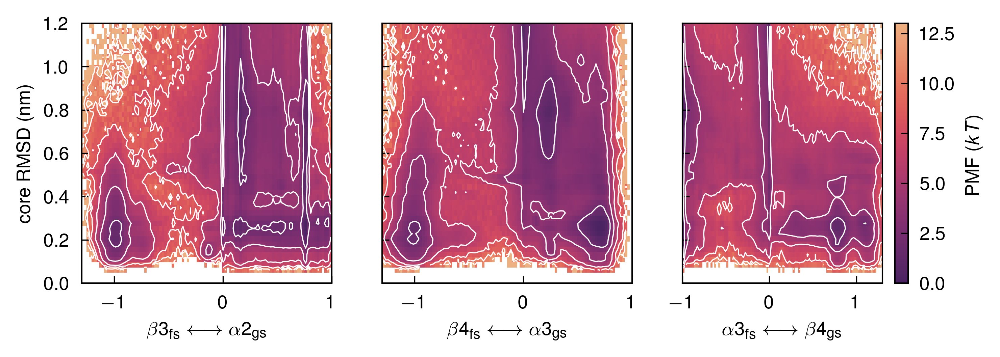

In [29]:
# plot averages of different cvs
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(6.5, 2), dpi=500)

ye = np.linspace(0, 1.2, 51)
yc = (ye[1:] + ye[:-1]) / 2
clines = np.arange(0, 13, 2)

cvs = [c_orange, c_green, c_blue]
labels = [
    r"$\beta3_{\mathrm{fs}}\longleftrightarrow\alpha2_{\mathrm{gs}}$",
    r"$\beta4_{\mathrm{fs}}\longleftrightarrow\alpha3_{\mathrm{gs}}$",
    r"$\alpha3_{\mathrm{fs}}\longleftrightarrow \beta4_{\mathrm{gs}}$",
]
ranges = [(-1.3, 1), (-1.3, 1.0), (-1, 1.3)]

for ax, cv, label, lim in zip(axes, cvs, labels, ranges):
    xe = np.linspace(*lim, 101)
    xc = (xe[1:] + xe[:-1]) / 2
    hist = extq.projection.density2d(cv, r_rmsds, w_nb, xe, ye)
    offset = np.min(-np.log(hist))
    pmf = -np.log(hist) - offset
    pc = ax.pcolormesh(xc, yc, pmf.T, vmax=13, cmap="flare_r", rasterized=True)
    ax.contour(xc, yc, pmf.T, colors="white", levels=clines, linewidths=0.5)
    ax.set_ylabel("core RMSD (nm)")
    ax.set_xlabel(label)
    ax.label_outer()
cb = plt.colorbar(pc, ax=axes[-1], label="PMF ($kT$)", location="right")

In [30]:
def load_fs_contacts():
    q_gs_all, q_gs, q_fs_all, q_fs, q_core = [], [], [], [], []
    for d, head in zip(output_dirs, heads):
        q_gs_all.extend(np.load(f"{work_dir}/{d}/outputs/{head}_q_gs_all.pkl", allow_pickle=True))
        q_gs.extend(np.load(f"{work_dir}/{d}/outputs/{head}_q_gs.pkl", allow_pickle=True))
        q_fs_all.extend(np.load(f"{work_dir}/{d}/outputs/{head}_q_fs_all.pkl", allow_pickle=True))
        q_fs.extend(np.load(f"{work_dir}/{d}/outputs/{head}_q_fs.pkl", allow_pickle=True))
        q_core.extend(np.load(f"{work_dir}/{d}/outputs/{head}_q_core.pkl", allow_pickle=True))

    q_gs_all = [traj[start_frame:end_frame:skip] for traj in q_gs_all]
    q_fs_all = [traj[start_frame:end_frame:skip] for traj in q_fs_all]
    q_gs = [traj[start_frame:end_frame:skip] for traj in q_gs]
    q_fs = [traj[start_frame:end_frame:skip] for traj in q_fs]
    q_core = [traj[start_frame:end_frame:skip] for traj in q_core]

    return q_gs_all, q_gs, q_fs_all, q_fs, q_core

In [31]:
def load_omegas():
    omegas = []
    for d, n in zip(output_dirs, output_names):
        for i in np.arange(n_rep):
            j = str(i).zfill(2)
            omegas.append(
                np.load(f"{work_dir}/{d}/outputs/{n}.run.{j}_Omega.npy")[start_frame:end_frame:skip]
            )
    return np.array(omegas)

In [32]:
q_gs_all, q_gs, q_fs_all, q_fs, q_core = load_fs_contacts()
print(q_gs[0].shape)

(32000,)


In [33]:
omegas = load_omegas()

In [34]:
omegas.shape

(384, 32000, 7)

In [35]:
n_cis = np.sum((np.abs(omegas[..., 3:]) <= (np.pi / 2.0)).astype(int), axis=-1)
p63_cis = (np.abs(omegas[..., 3]) <= (np.pi / 2.0)).astype(int)
p70_cis = (np.abs(omegas[..., 4]) <= (np.pi / 2.0)).astype(int)
p71_cis = (np.abs(omegas[..., 5]) <= (np.pi / 2.0)).astype(int)
p72_cis = (np.abs(omegas[..., 6]) <= (np.pi / 2.0)).astype(int)

In [36]:
p_rmsd_arr = np.asarray(p_rmsds).ravel()
f_rmsd_arr = np.asarray(f_rmsds).ravel()
q_fs_arr = np.asarray(q_fs).ravel()
q_gs_arr = np.asarray(q_gs).ravel()
in_fs = np.logical_and(
    c_green_arr < -0.78,
    np.logical_and(c_blue_arr < -0.83, np.logical_and(c_orange_arr < -0.75, q_fs_arr > 0.75)),
)

in_gs = np.logical_and(
    c_green_arr > 0.67,
    np.logical_and(c_blue_arr > 0.88, np.logical_and(c_orange_arr > 0.75, q_gs_arr > 0.75)),
)
in_fs = np.array(np.split(in_fs, traj_inds))
in_gs = np.array(np.split(in_gs, traj_inds))

In [37]:
# % cis in fs/gs
w_nb = np.array(w_nb)
for p, num in zip([p63_cis, p70_cis, p71_cis, p72_cis], [63, 70, 71, 72]):
    N_fs = np.sum(w_nb[in_fs])
    N_gs = np.sum(w_nb[in_gs])
    print(f"P{num}: fs {np.sum(p[in_fs] * w_nb[in_fs]) / N_fs * 100:.1f}% cis")
    print(f"P{num}: gs {np.sum(p[in_gs] * w_nb[in_gs]) / N_gs * 100:.1f}% cis")

P63: fs 28.7% cis
P63: gs 0.0% cis
P70: fs 8.2% cis
P70: gs 0.1% cis
P71: fs 89.9% cis
P71: gs 0.0% cis
P72: fs 3.8% cis
P72: gs 5.6% cis


In [38]:
print(np.mean(np.array(q_gs_all)[in_gs]))
print(np.mean(np.array(q_gs_all)[in_fs]))

print(np.mean(np.array(q_gs)[in_gs]))
print(np.mean(np.array(q_gs)[in_fs]))

print(np.mean(np.array(q_fs_all)[in_gs]))
print(np.mean(np.array(q_fs_all)[in_fs]))

print(np.mean(np.array(q_fs)[in_gs]))
print(np.mean(np.array(q_fs)[in_fs]))

0.79884154
0.37178338
0.84043366
0.09499152
0.41247708
0.76822495
0.077825055
0.83996147


/scratch/local/jobs/15563240/ipykernel_2293276/321511339.py:17: RuntimeWarning: divide by zero encountered in log
  offset = np.min(-np.log(hist))
/scratch/local/jobs/15563240/ipykernel_2293276/321511339.py:18: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(hist) - offset


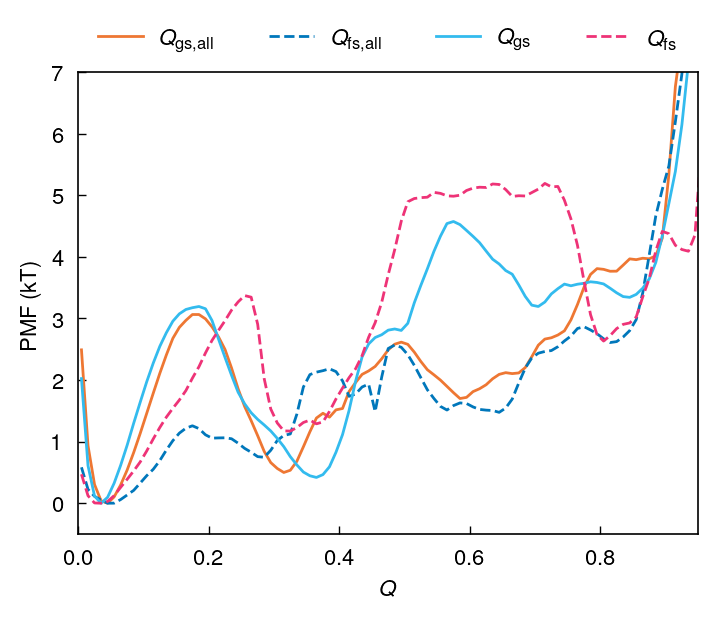

In [39]:
# 1D PMFs
cvs = [q_gs_all, q_gs, q_fs_all, q_fs] #, q_core]
labels = [
    r"$Q_{\mathrm{gs, all}}$",
    r"$Q_{\mathrm{fs, all}}$",
    r"$Q_{\mathrm{gs}}$",
    r"$Q_{\mathrm{fs}}$",
    # r"$Q_{\mathrm{core}}$",
]
linestyles = ["-", "--", "-", "--"]
xe = np.linspace(0, 1, 101)
xc = (xe[:-1] + xe[1:]) / 2

f, ax = plt.subplots(figsize=(4, 3), dpi=200)
for cv, label, ls in zip(cvs, labels, linestyles):
    hist = extq.projection.density1d(cv, w_nb, xe)
    offset = np.min(-np.log(hist))
    pmf = -np.log(hist) - offset
    ax.plot(xc, pmf, label=label, lw=1, ls=ls)
ax.set_xlim([0, 0.95])
ax.set_ylim([-0.5, 7])
ax.set_xlabel("$Q$")
ax.set_ylabel("PMF (kT)")
pplt.legend(outside="top")

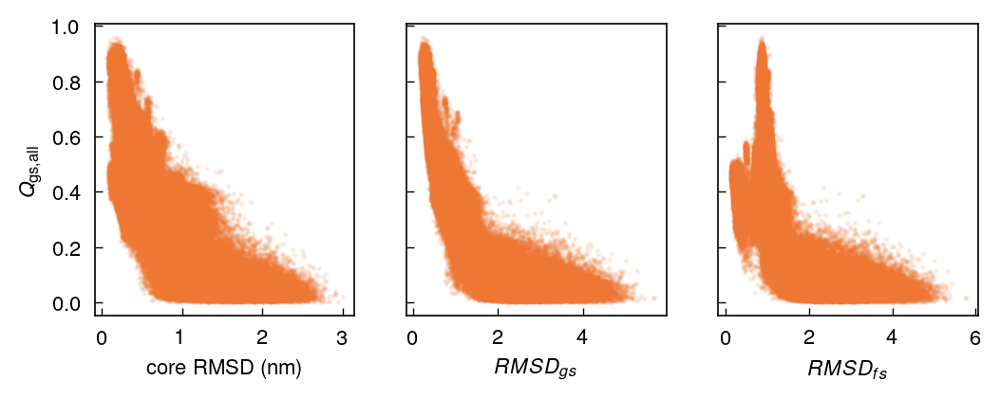

In [40]:
labels = ["core RMSD (nm)", r"$RMSD_{gs}$", r"$RMSD_{fs}$"]
f, axes = plt.subplots(1, 3, figsize=(6, 2), dpi=200, sharey=True)
for cv, ax, l in zip([r_rmsds, p_rmsds, f_rmsds], axes, labels):
    ax.plot(np.concatenate(cv)[::50], np.concatenate(q_gs_all)[::50], ".", alpha=0.1)
    ax.set_xlabel(l)
    ax.set_ylabel(r"$Q_{\mathrm{gs, all}}$")
    ax.label_outer()

/scratch/local/jobs/15563240/ipykernel_2293276/2826210747.py:20: RuntimeWarning: divide by zero encountered in log
  offset = np.min(-np.log(hist))
/scratch/local/jobs/15563240/ipykernel_2293276/2826210747.py:21: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(hist) - offset


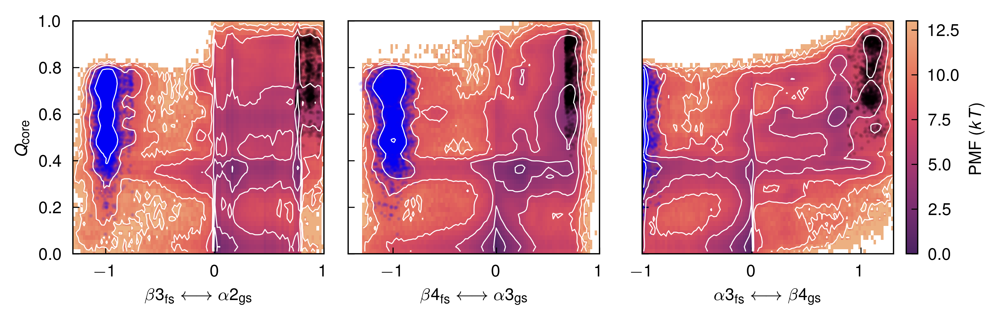

In [41]:
# plot averages of different cvs
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(6.5, 2), dpi=500, constrained_layout=True)

ye = np.linspace(0, 1.0, 51)
yc = (ye[1:] + ye[:-1]) / 2
clines = np.arange(0, 13, 2)

cvs = [c_orange, c_green, c_blue]
labels = [
    r"$\beta3_{\mathrm{fs}}\longleftrightarrow\alpha2_{\mathrm{gs}}$",
    r"$\beta4_{\mathrm{fs}}\longleftrightarrow\alpha3_{\mathrm{gs}}$",
    r"$\alpha3_{\mathrm{fs}}\longleftrightarrow \beta4_{\mathrm{gs}}$",
]
ranges = [(-1.3, 1), (-1.3, 1.0), (-1, 1.3)]

for ax, cv, label, lim in zip(axes, cvs, labels, ranges):
    xe = np.linspace(*lim, 101)
    xc = (xe[1:] + xe[:-1]) / 2
    hist = extq.projection.density2d(cv, q_core, w_nb, xe, ye)
    offset = np.min(-np.log(hist))
    pmf = -np.log(hist) - offset
    pc = ax.pcolormesh(xc, yc, pmf.T, vmax=13, cmap="flare_r", rasterized=True)
    ax.plot(np.array(cv)[in_gs][::100], np.array(q_core)[in_gs][::100], ".", alpha=0.1, color="k")
    ax.plot(np.array(cv)[in_fs][::100], np.array(q_core)[in_fs][::100], ".", alpha=0.1, color="b")
    ax.contour(xc, yc, pmf.T, colors="white", levels=clines, linewidths=0.5)
    ax.set_ylabel(r"$Q_{\mathrm{core}}$")
    ax.set_xlabel(label)
    ax.label_outer()
cb = plt.colorbar(pc, ax=axes[-1], label="PMF ($kT$)", location="right")

/scratch/local/jobs/15563240/ipykernel_2293276/530172669.py:20: RuntimeWarning: divide by zero encountered in log
  offset = np.min(-np.log(hist))
/scratch/local/jobs/15563240/ipykernel_2293276/530172669.py:21: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(hist) - offset


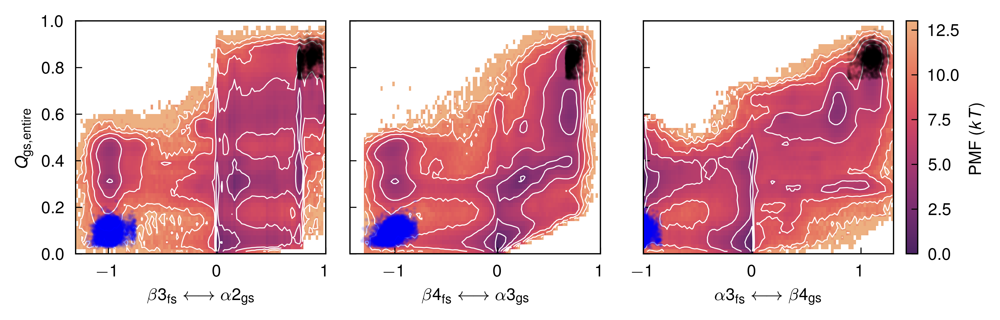

In [42]:
# plot averages of different cvs
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(6.5, 2), dpi=500, constrained_layout=True)

ye = np.linspace(0, 1.0, 51)
yc = (ye[1:] + ye[:-1]) / 2
clines = np.arange(0, 13, 2)

cvs = [c_orange, c_green, c_blue]
labels = [
    r"$\beta3_{\mathrm{fs}}\longleftrightarrow\alpha2_{\mathrm{gs}}$",
    r"$\beta4_{\mathrm{fs}}\longleftrightarrow\alpha3_{\mathrm{gs}}$",
    r"$\alpha3_{\mathrm{fs}}\longleftrightarrow \beta4_{\mathrm{gs}}$",
]
ranges = [(-1.3, 1), (-1.3, 1.0), (-1, 1.3)]

for ax, cv, label, lim in zip(axes, cvs, labels, ranges):
    xe = np.linspace(*lim, 101)
    xc = (xe[1:] + xe[:-1]) / 2
    hist = extq.projection.density2d(cv, q_gs_all, w_nb, xe, ye)
    offset = np.min(-np.log(hist))
    pmf = -np.log(hist) - offset
    pc = ax.pcolormesh(xc, yc, pmf.T, vmax=13, cmap="flare_r", rasterized=True)
    ax.contour(xc, yc, pmf.T, colors="white", levels=clines, linewidths=0.5)
    ax.plot(np.array(cv)[in_gs][::100], np.array(q_gs)[in_gs][::100], ".", alpha=0.1, color="k")
    ax.plot(np.array(cv)[in_fs][::100], np.array(q_gs)[in_fs][::100], ".", alpha=0.1, color="b")
    ax.set_ylabel(r"$Q_{\mathrm{gs, entire}}$")
    ax.set_xlabel(label)
    ax.label_outer()
cb = plt.colorbar(pc, ax=axes[-1], label="PMF ($kT$)", location="right")

/scratch/local/jobs/15563240/ipykernel_2293276/2366353117.py:20: RuntimeWarning: divide by zero encountered in log
  offset = np.min(-np.log(hist))
/scratch/local/jobs/15563240/ipykernel_2293276/2366353117.py:21: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(hist) - offset


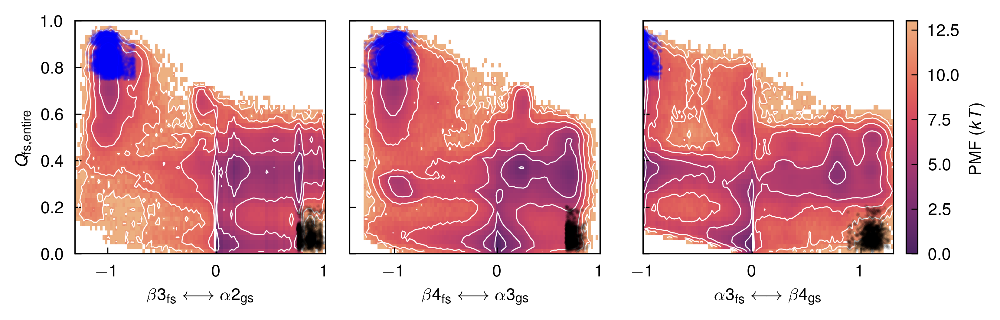

In [43]:
# plot averages of different cvs
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(6.5, 2), dpi=500, constrained_layout=True)

ye = np.linspace(0, 1.0, 51)
yc = (ye[1:] + ye[:-1]) / 2
clines = np.arange(0, 13, 2)

cvs = [c_orange, c_green, c_blue]
labels = [
    r"$\beta3_{\mathrm{fs}}\longleftrightarrow\alpha2_{\mathrm{gs}}$",
    r"$\beta4_{\mathrm{fs}}\longleftrightarrow\alpha3_{\mathrm{gs}}$",
    r"$\alpha3_{\mathrm{fs}}\longleftrightarrow \beta4_{\mathrm{gs}}$",
]
ranges = [(-1.3, 1), (-1.3, 1.0), (-1, 1.3)]

for ax, cv, label, lim in zip(axes, cvs, labels, ranges):
    xe = np.linspace(*lim, 101)
    xc = (xe[1:] + xe[:-1]) / 2
    hist = extq.projection.density2d(cv, q_fs_all, w_nb, xe, ye)
    offset = np.min(-np.log(hist))
    pmf = -np.log(hist) - offset
    pc = ax.pcolormesh(xc, yc, pmf.T, vmax=13, cmap="flare_r", rasterized=True)
    ax.contour(xc, yc, pmf.T, colors="white", levels=clines, linewidths=0.5)
    ax.plot(np.array(cv)[in_gs][::100], np.array(q_fs)[in_gs][::100], ".", alpha=0.1, color="k")
    ax.plot(np.array(cv)[in_fs][::100], np.array(q_fs)[in_fs][::100], ".", alpha=0.1, color="b")
    ax.set_ylabel(r"$Q_{\mathrm{fs, entire}}$")
    ax.set_xlabel(label)
    ax.label_outer()
cb = plt.colorbar(pc, ax=axes[-1], label="PMF ($kT$)", location="right")

/scratch/local/jobs/15563240/ipykernel_2293276/1466436716.py:20: RuntimeWarning: divide by zero encountered in log
  offset = np.min(-np.log(hist))
/scratch/local/jobs/15563240/ipykernel_2293276/1466436716.py:21: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(hist) - offset


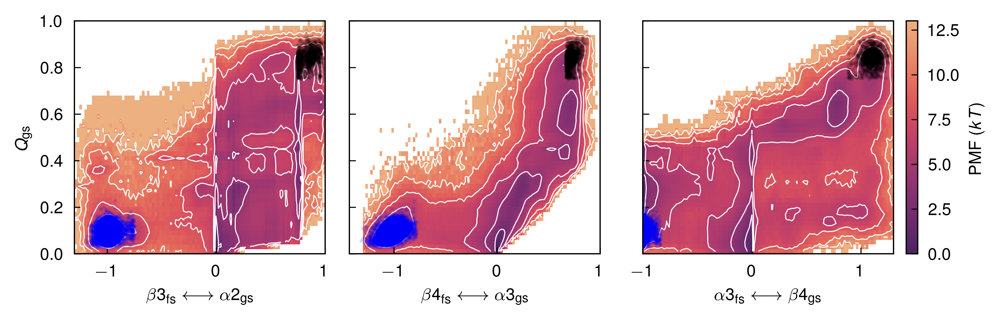

In [44]:
# plot averages of different cvs
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(6.5, 2), dpi=500, constrained_layout=True)

ye = np.linspace(0, 1.0, 51)
yc = (ye[1:] + ye[:-1]) / 2
clines = np.arange(0, 13, 2)

cvs = [c_orange, c_green, c_blue]
labels = [
    r"$\beta3_{\mathrm{fs}}\longleftrightarrow\alpha2_{\mathrm{gs}}$",
    r"$\beta4_{\mathrm{fs}}\longleftrightarrow\alpha3_{\mathrm{gs}}$",
    r"$\alpha3_{\mathrm{fs}}\longleftrightarrow \beta4_{\mathrm{gs}}$",
]
ranges = [(-1.3, 1), (-1.3, 1.0), (-1, 1.3)]

for ax, cv, label, lim in zip(axes, cvs, labels, ranges):
    xe = np.linspace(*lim, 101)
    xc = (xe[1:] + xe[:-1]) / 2
    hist = extq.projection.density2d(cv, q_gs, w_nb, xe, ye)
    offset = np.min(-np.log(hist))
    pmf = -np.log(hist) - offset
    pc = ax.pcolormesh(xc, yc, pmf.T, vmax=13, cmap="flare_r", rasterized=True)
    ax.contour(xc, yc, pmf.T, colors="white", levels=clines, linewidths=0.5)
    ax.plot(np.array(cv)[in_gs][::100], np.array(q_gs)[in_gs][::100], ".", alpha=0.1, color="k")
    ax.plot(np.array(cv)[in_fs][::100], np.array(q_gs)[in_fs][::100], ".", alpha=0.1, color="b")
    ax.set_ylabel(r"$Q_{\mathrm{gs}}$")
    ax.set_xlabel(label)
    ax.label_outer()
cb = plt.colorbar(pc, ax=axes[-1], label="PMF ($kT$)", location="right")

/scratch/local/jobs/15563240/ipykernel_2293276/2410750865.py:20: RuntimeWarning: divide by zero encountered in log
  offset = np.min(-np.log(hist))
/scratch/local/jobs/15563240/ipykernel_2293276/2410750865.py:21: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(hist) - offset


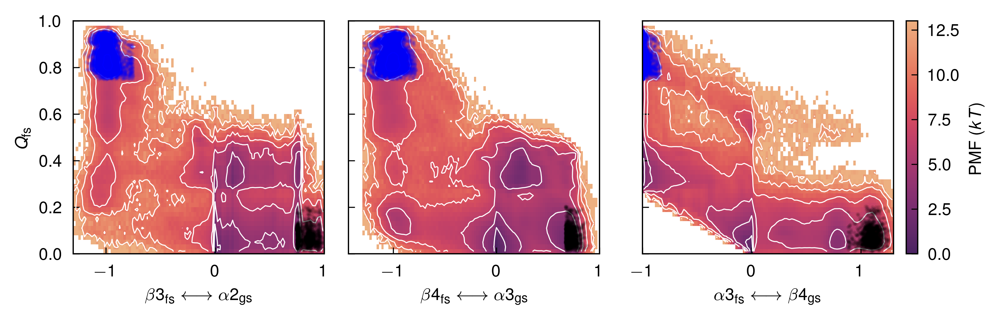

In [45]:
# plot averages of different cvs
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(6.5, 2), dpi=500, constrained_layout=True)

ye = np.linspace(0, 1.0, 51)
yc = (ye[1:] + ye[:-1]) / 2
clines = np.arange(0, 13, 2)

cvs = [c_orange, c_green, c_blue]
labels = [
    r"$\beta3_{\mathrm{fs}}\longleftrightarrow\alpha2_{\mathrm{gs}}$",
    r"$\beta4_{\mathrm{fs}}\longleftrightarrow\alpha3_{\mathrm{gs}}$",
    r"$\alpha3_{\mathrm{fs}}\longleftrightarrow \beta4_{\mathrm{gs}}$",
]
ranges = [(-1.3, 1), (-1.3, 1.0), (-1, 1.3)]

for ax, cv, label, lim in zip(axes, cvs, labels, ranges):
    xe = np.linspace(*lim, 101)
    xc = (xe[1:] + xe[:-1]) / 2
    hist = extq.projection.density2d(cv, q_fs, w_nb, xe, ye)
    offset = np.min(-np.log(hist))
    pmf = -np.log(hist) - offset
    pc = ax.pcolormesh(xc, yc, pmf.T, vmax=13, cmap="flare_r", rasterized=True)
    ax.contour(xc, yc, pmf.T, colors="white", levels=clines, linewidths=0.5)
    ax.plot(np.array(cv)[in_gs][::100], np.array(q_fs)[in_gs][::100], ".", alpha=0.1, color="k")
    ax.plot(np.array(cv)[in_fs][::100], np.array(q_fs)[in_fs][::100], ".", alpha=0.1, color="b")
    ax.set_ylabel(r"$Q_{\mathrm{fs}}$")
    ax.set_xlabel(label)
    ax.label_outer()
cb = plt.colorbar(pc, ax=axes[-1], label="PMF ($kT$)", location="right")

/project/dinner/scguo/extq/src/extq/projection.py:145: RuntimeWarning: invalid value encountered in divide
  return numer / denom


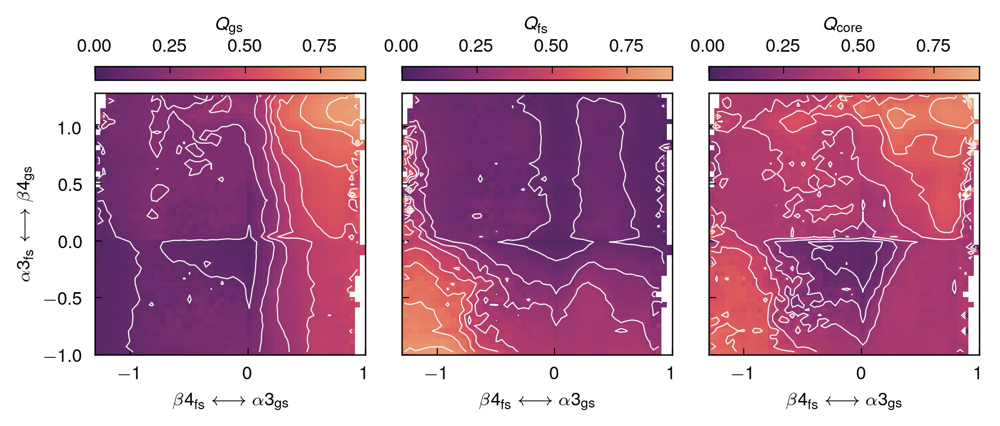

In [46]:
# plot averages of different cvs
fig, axes = plt.subplots(
    nrows=1, ncols=3, figsize=(6, 2.5), sharex=True, sharey=True, dpi=300, constrained_layout=True
)

xe = np.linspace(-1.3, 1.0, 51)
ye = np.linspace(-1, 1.3, 51)
xc = (xe[1:] + xe[:-1]) / 2
yc = (ye[1:] + ye[:-1]) / 2
clines = np.linspace(0, 1, 11)

cvs = [q_gs, q_fs, q_core]
labels = [
    r"$Q_{\mathrm{gs}}$",
    r"$Q_{\mathrm{fs}}$",
    r"$Q_{\mathrm{core}}$",
]

for ax, cv, label in zip(axes, cvs, labels):
    hist = extq.projection.average2d(c_green, c_blue, cv, w_nb, xe, ye)
    pc = ax.pcolormesh(xc, yc, hist.T, cmap="flare_r", rasterized=True, vmin=0, vmax=0.9)
    ax.contour(xc, yc, hist.T, colors="white", levels=clines, linewidths=0.5)
    ax.set_ylabel(r"$\alpha3_{\mathrm{fs}}\longleftrightarrow \beta4_{\mathrm{gs}}$")
    ax.set_xlabel(r"$\beta4_{\mathrm{fs}}\longleftrightarrow\alpha3_{\mathrm{gs}}$")
    ax.label_outer()
    cb = plt.colorbar(pc, ax=ax, label=label, location="top")

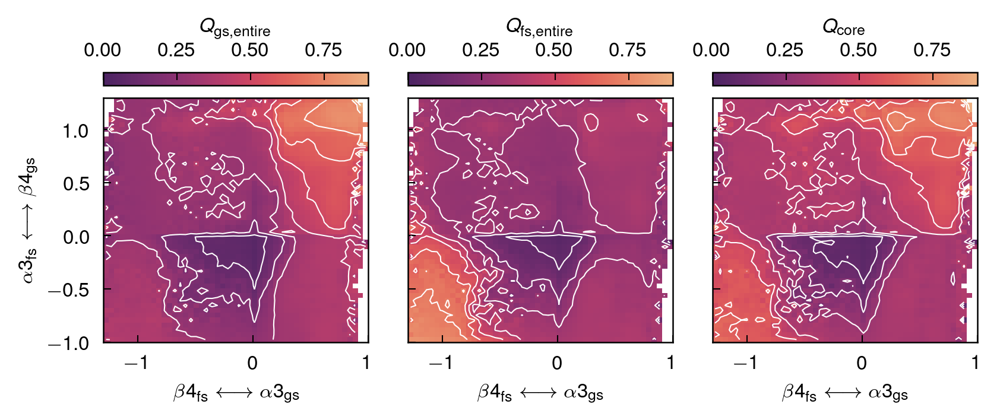

In [47]:
# plot averages of different cvs
fig, axes = plt.subplots(
    nrows=1, ncols=3, figsize=(5.5, 2.25), sharex=True, sharey=True, dpi=300, constrained_layout=True
)

xe = np.linspace(-1.3, 1.0, 51)
ye = np.linspace(-1, 1.3, 51)
xc = (xe[1:] + xe[:-1]) / 2
yc = (ye[1:] + ye[:-1]) / 2
clines = np.linspace(0, 1, 11)

cvs = [q_gs_all, q_fs_all, q_core]
labels = [
    r"$Q_{\mathrm{gs, entire}}$",
    r"$Q_{\mathrm{fs, entire}}$",
    r"$Q_{\mathrm{core}}$",
]

for ax, cv, label in zip(axes, cvs, labels):
    hist = extq.projection.average2d(c_green, c_blue, cv, w_nb, xe, ye)
    pc = ax.pcolormesh(xc, yc, hist.T, cmap="flare_r", rasterized=True, vmin=0, vmax=0.9)
    ax.contour(xc, yc, hist.T, colors="white", levels=clines, linewidths=0.5)
    ax.set_ylabel(r"$\alpha3_{\mathrm{fs}}\longleftrightarrow \beta4_{\mathrm{gs}}$")
    ax.set_xlabel(r"$\beta4_{\mathrm{fs}}\longleftrightarrow\alpha3_{\mathrm{gs}}$")
    ax.label_outer()
    cb = plt.colorbar(pc, ax=ax, label=label, location="top")

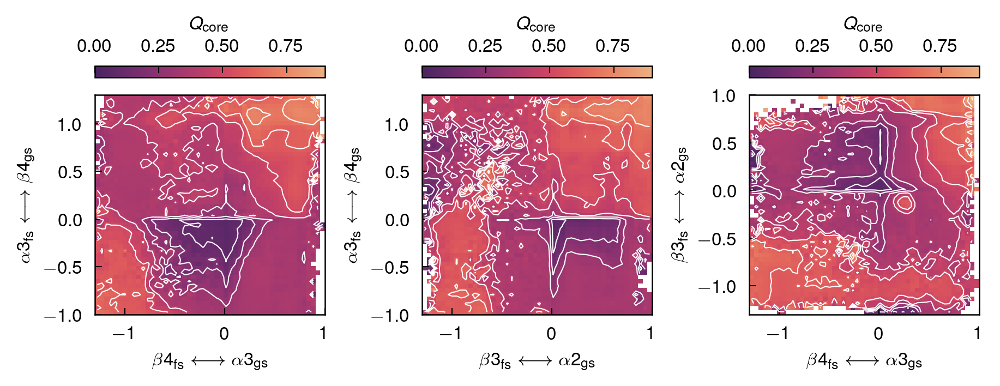

In [48]:
# plot averages of different cvs
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(6, 2.25), dpi=300, constrained_layout=True)
clines = np.linspace(0, 0.9, 10)
combinations = [(1, 0), (2, 0), (1, 2)]
cvs = [c_blue, c_green, c_orange]
labels = [
    r"$\alpha3_{\mathrm{fs}}\longleftrightarrow \beta4_{\mathrm{gs}}$",
    r"$\beta4_{\mathrm{fs}}\longleftrightarrow\alpha3_{\mathrm{gs}}$",
    r"$\beta3_{\mathrm{fs}}\longleftrightarrow\alpha2_{\mathrm{gs}}$",
]
lims = [(-1, 1.3), (-1.3, 1), (-1.3, 1)]

for ax, (cv1, cv2) in zip(axes, combinations):
    xe = np.linspace(*lims[cv1], 51)
    ye = np.linspace(*lims[cv2], 51)
    xc = (xe[1:] + xe[:-1]) / 2
    yc = (ye[1:] + ye[:-1]) / 2
    clines = np.linspace(0, 1, 11)
    hist = extq.projection.average2d(cvs[cv1], cvs[cv2], q_core, w_nb, xe, ye)
    pc = ax.pcolormesh(xc, yc, hist.T, cmap="flare_r", rasterized=True, vmin=0, vmax=0.9)
    ax.contour(xc, yc, hist.T, colors="white", levels=clines, linewidths=0.5)
    ax.set_xlabel(labels[cv1])
    ax.set_ylabel(labels[cv2])
    cb = plt.colorbar(pc, ax=ax, label=r"$Q_{\mathrm{core}}$", location="top")

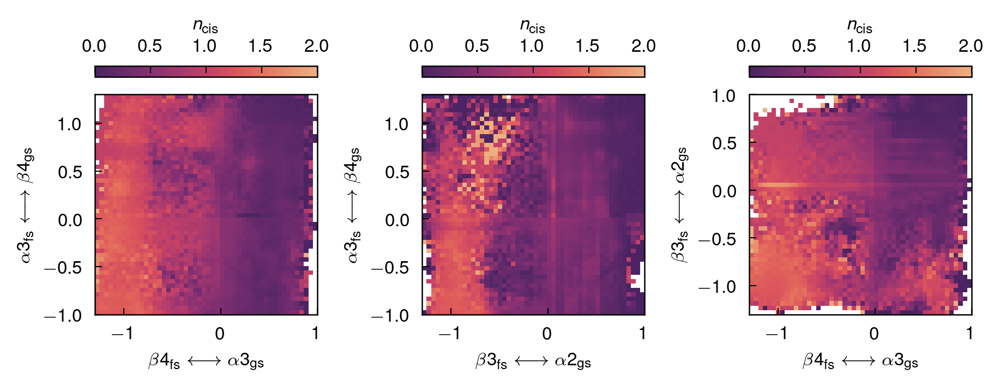

In [49]:
# plot averages of different cvs
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(6, 2.25), dpi=300, constrained_layout=True)
# clines = np.linspace(0, 2, 6)
combinations = [(1, 0), (2, 0), (1, 2)]
cvs = [c_blue, c_green, c_orange]
labels = [
    r"$\alpha3_{\mathrm{fs}}\longleftrightarrow \beta4_{\mathrm{gs}}$",
    r"$\beta4_{\mathrm{fs}}\longleftrightarrow\alpha3_{\mathrm{gs}}$",
    r"$\beta3_{\mathrm{fs}}\longleftrightarrow\alpha2_{\mathrm{gs}}$",
]
lims = [(-1, 1.3), (-1.3, 1), (-1.3, 1)]

for ax, (cv1, cv2) in zip(axes, combinations):
    xe = np.linspace(*lims[cv1], 51)
    ye = np.linspace(*lims[cv2], 51)
    xc = (xe[1:] + xe[:-1]) / 2
    yc = (ye[1:] + ye[:-1]) / 2
    clines = np.linspace(0, 1, 11)
    hist = extq.projection.average2d(cvs[cv1], cvs[cv2], n_cis, w_nb, xe, ye)
    pc = ax.pcolormesh(xc, yc, hist.T, cmap="flare_r", rasterized=True, vmin=0, vmax=2)
    # ax.contour(xc, yc, hist.T, colors="white", levels=clines, linewidths=0.5)
    ax.set_xlabel(labels[cv1])
    ax.set_ylabel(labels[cv2])
    cb = plt.colorbar(pc, ax=ax, label=r"$n_{\mathrm{cis}}$", location="top")

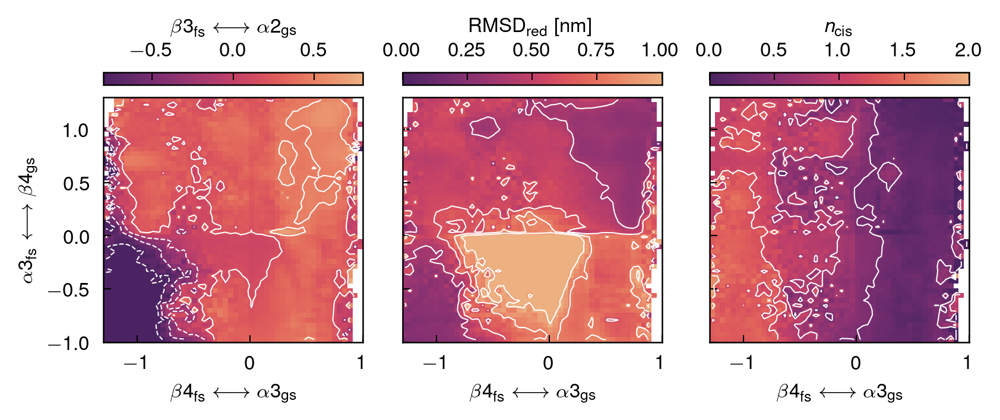

In [50]:
# plot averages of different cvs
fig, axes = plt.subplots(
    nrows=1, ncols=3, figsize=(5.5, 2.25), sharex=True, sharey=True, dpi=300, constrained_layout=True
)

xe = np.linspace(-1.3, 1.0, 51)
ye = np.linspace(-1, 1.3, 51)
xc = (xe[1:] + xe[:-1]) / 2
yc = (ye[1:] + ye[:-1]) / 2
#

cvs = [c_orange, r_rmsds, n_cis]
labels = [
    r"$\beta3_{\mathrm{fs}}\longleftrightarrow\alpha2_{\mathrm{gs}}$",
    r"RMSD$_{\mathrm{red}}$ [nm]",
    r"$n_{\mathrm{cis}}$",
]
ranges = [(-0.8, 0.8), (0, 1.0), (0, 2)]

for ax, cv, label, (vmin, vmax) in zip(axes, cvs, labels, ranges):
    hist = extq.projection.average2d(c_green, c_blue, cv, w_nb, xe, ye)
    pc = ax.pcolormesh(xc, yc, hist.T, cmap="flare_r", rasterized=True, vmin=vmin, vmax=vmax)
    clines = np.linspace(vmin, vmax, 6)
    ax.contour(xc, yc, hist.T, colors="white", levels=clines, linewidths=0.5)
    ax.set_ylabel(r"$\alpha3_{\mathrm{fs}}\longleftrightarrow \beta4_{\mathrm{gs}}$")
    ax.set_xlabel(r"$\beta4_{\mathrm{fs}}\longleftrightarrow\alpha3_{\mathrm{gs}}$")
    ax.label_outer()
    cb = plt.colorbar(pc, ax=ax, label=label, location="top")

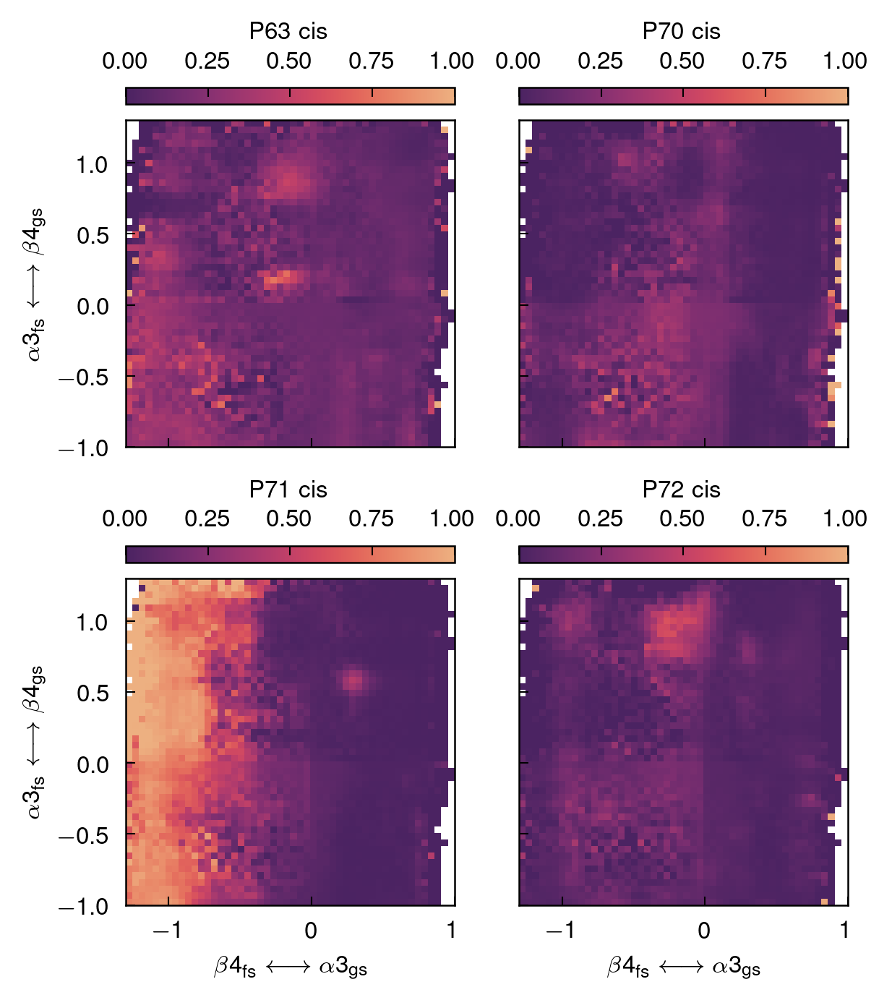

In [51]:
# plot averages of different cvs
fig, axes = plt.subplots(
    nrows=2, ncols=2, figsize=(4, 4.5), sharex=True, sharey=True, dpi=300, constrained_layout=True
)

xe = np.linspace(-1.3, 1.0, 51)
ye = np.linspace(-1, 1.3, 51)
xc = (xe[1:] + xe[:-1]) / 2
yc = (ye[1:] + ye[:-1]) / 2
#

cvs = [p63_cis, p70_cis, p71_cis, p72_cis]

for ax, cv, p in zip(axes.flat, cvs, [63, 70, 71, 72]):
    hist = extq.projection.average2d(c_green, c_blue, cv, w_nb, xe, ye)
    pc = ax.pcolormesh(xc, yc, hist.T, cmap="flare_r", rasterized=True, vmin=0, vmax=1)
    ax.set_ylabel(r"$\alpha3_{\mathrm{fs}}\longleftrightarrow \beta4_{\mathrm{gs}}$")
    ax.set_xlabel(r"$\beta4_{\mathrm{fs}}\longleftrightarrow\alpha3_{\mathrm{gs}}$")
    ax.label_outer()
    cb = plt.colorbar(pc, ax=ax, label=f"P{p} cis", location="top")

## different temperature

/scratch/local/jobs/15563240/ipykernel_2293276/1110465168.py:17: RuntimeWarning: divide by zero encountered in log
  offset = np.min(-np.log(hist))
/scratch/local/jobs/15563240/ipykernel_2293276/1110465168.py:18: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(hist) - offset


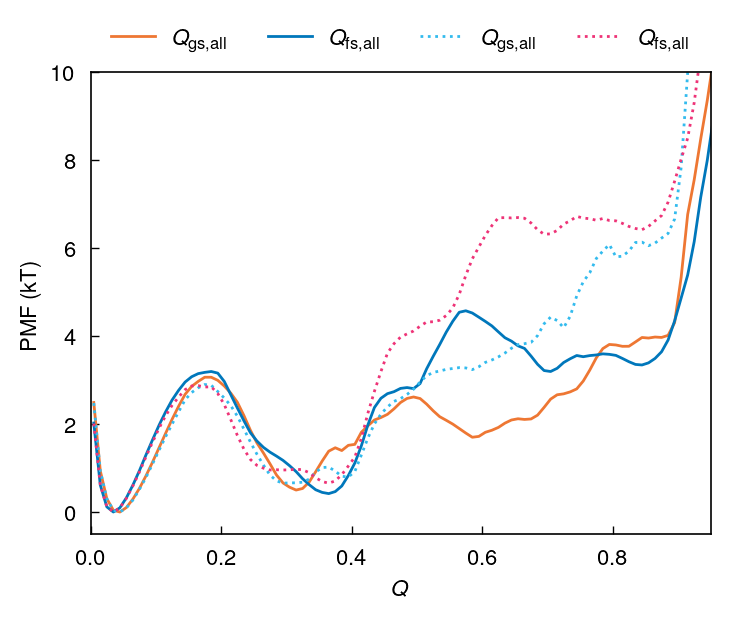

In [52]:
# 1D PMFs

cvs = [q_gs_all, q_fs_all]
labels = [
    r"$Q_{\mathrm{gs, all}}$",
    r"$Q_{\mathrm{fs, all}}$",
]
linestyles = ["-", ":"]
xe = np.linspace(0, 1, 101)
xc = (xe[:-1] + xe[1:]) / 2

f, ax = plt.subplots(figsize=(4, 3), dpi=200)
for temp, ls in zip((0.87, 0.91), linestyles):
    w_nb = np.split(reweight(temp), traj_inds)
    for cv, label in zip(cvs, labels):
        hist = extq.projection.density1d(cv, w_nb, xe)
        offset = np.min(-np.log(hist))
        pmf = -np.log(hist) - offset
        ax.plot(xc, pmf, label=label, lw=1, ls=ls)
    ax.set_xlim([0, 0.95])
    ax.set_ylim([-0.5, 10])
    ax.set_xlabel("$Q$")
    ax.set_ylabel("PMF (kT)")
pplt.legend(outside="top")

In [53]:
np.array(w_nb).shape

(384, 32000)

In [56]:
for temp in (0.87, 0.89, 0.91):
    w_nb = np.split(reweight(temp), traj_inds)
    np.save(f"/project/dinner/scguo/kaiB/dga/new_{int(temp*100)}/data/mbar_weights.npy", w_nb)

# Sample initial structures for DGA runs

In [82]:
len(c_green), c_green[0].shape

(384, (32000,))

In [84]:
# try to estimate timeseries correlation
g = timeseries.statistical_inefficiency_multiple(pot)
print(f"{g=}")

g=239758.08512197965


In [87]:
g = timeseries.statistical_inefficiency_multiple(np.asarray(c_green)[:, ::10])
print(g)

2366.6281131948


In [88]:
g = timeseries.statistical_inefficiency_multiple(np.asarray(c_blue)[:, ::10])
print(g)
g = timeseries.statistical_inefficiency_multiple(np.asarray(c_orange)[:, ::10])
print(g)
g = timeseries.statistical_inefficiency_multiple(np.reshape(pot[:, ::10], (384, -1)))
print(g)

2259.6021799229484
2096.3323267432324
3041.9376142981455


In [111]:
# sample equally spaced from last N frames
def sample_structures(N, k, weights, save=False, savedir="/project/dinner/scguo/kaiB/dga/seeds_remd"):
    traj_files = []
    seednames_file = open(f"{savedir}/files.txt", mode='w+')
    for d, n in zip(output_dirs, output_names):
        for i in np.arange(n_rep):
            j = str(i).zfill(2)
            trajfile = f"{work_dir}/{d}/{n}.run.{j}.h5"
            traj_files.append(trajfile)
            if save:
                traj = md.load(trajfile)
                # subsample
                traj = traj[start_frame:end_frame:skip]
                # save 
                for framid, frame in enumerate(traj[-N::k]):
                    seedname = f"{savedir}/{d}_{j}_{framid}.pdb"
                    frame.save(seedname)
                    print(seedname)
                    seednames_file.write(f"{seedname}\n")
    seednames_file.close()            

    total = N // k * len(traj_files)
    print(f"total number of structures: {total}")
    return np.asarray(weights)[:, -N::k]

In [101]:
N = 32000
k = 1000
weights_sampled = sample_structures(N, k, w_nb)

total number of structures: 12288


In [ ]:
_ = sample_structures(N, k, w_nb, save=True)

/project/dinner/scguo/kaiB/dga/seeds_remd/gs_p2.5_00_0.pdb
/project/dinner/scguo/kaiB/dga/seeds_remd/gs_p2.5_00_1.pdb
/project/dinner/scguo/kaiB/dga/seeds_remd/gs_p2.5_00_2.pdb
/project/dinner/scguo/kaiB/dga/seeds_remd/gs_p2.5_00_3.pdb
/project/dinner/scguo/kaiB/dga/seeds_remd/gs_p2.5_00_4.pdb
/project/dinner/scguo/kaiB/dga/seeds_remd/gs_p2.5_00_5.pdb
/project/dinner/scguo/kaiB/dga/seeds_remd/gs_p2.5_00_6.pdb
/project/dinner/scguo/kaiB/dga/seeds_remd/gs_p2.5_00_7.pdb
/project/dinner/scguo/kaiB/dga/seeds_remd/gs_p2.5_00_8.pdb
/project/dinner/scguo/kaiB/dga/seeds_remd/gs_p2.5_00_9.pdb
/project/dinner/scguo/kaiB/dga/seeds_remd/gs_p2.5_00_10.pdb
/project/dinner/scguo/kaiB/dga/seeds_remd/gs_p2.5_00_11.pdb
/project/dinner/scguo/kaiB/dga/seeds_remd/gs_p2.5_00_12.pdb
/project/dinner/scguo/kaiB/dga/seeds_remd/gs_p2.5_00_13.pdb
/project/dinner/scguo/kaiB/dga/seeds_remd/gs_p2.5_00_14.pdb
/project/dinner/scguo/kaiB/dga/seeds_remd/gs_p2.5_00_15.pdb
/project/dinner/scguo/kaiB/dga/seeds_remd/gs_p2.5_

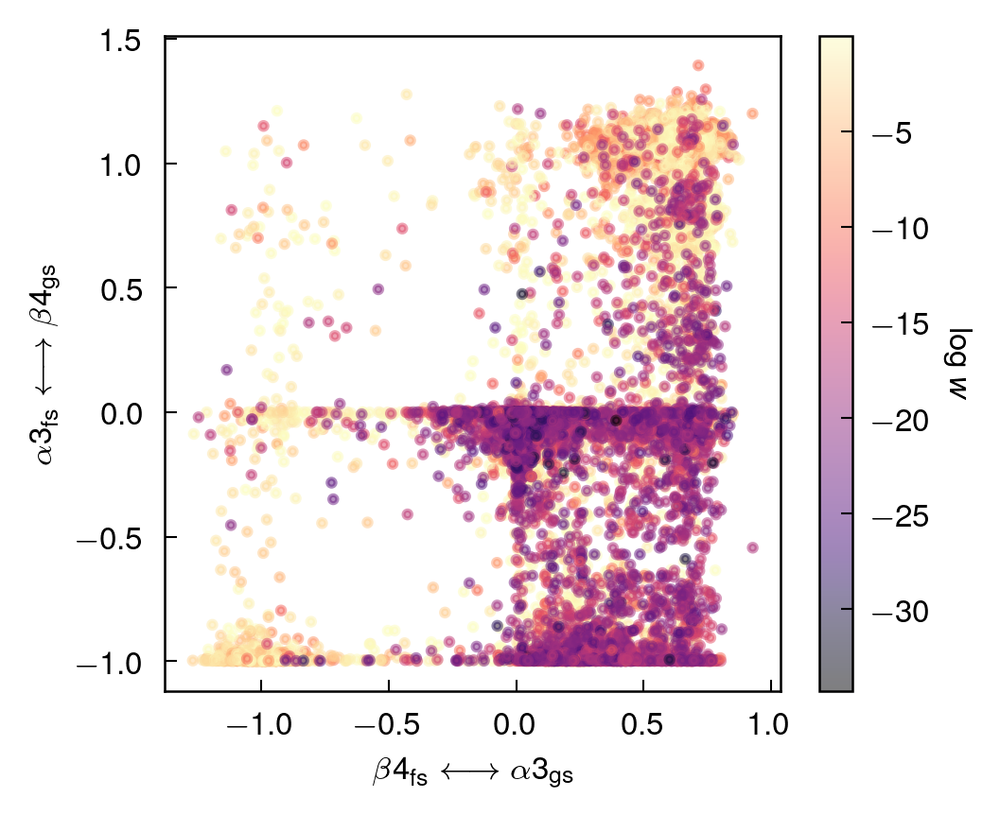

In [102]:
fig, ax = plt.subplots(figsize=(3.5, 3), dpi=300)

green_sampled = np.asarray(c_green)[:, -N::k]
blue_sampled = np.asarray(c_blue)[:, -N::k]

sc = plt.scatter(np.ravel(green_sampled), np.ravel(blue_sampled), c=np.ravel(np.log(weights_sampled)), cmap="magma", alpha=0.5)
ax.set_ylabel(r"$\alpha3_{\mathrm{fs}}\longleftrightarrow \beta4_{\mathrm{gs}}$")
ax.set_xlabel(r"$\beta4_{\mathrm{fs}}\longleftrightarrow\alpha3_{\mathrm{gs}}$")
cb = plt.colorbar(sc, ax=ax)
cb.set_label(r"$\log w$", rotation=-90, labelpad=10)

/scratch/local/jobs/11579571/ipykernel_1885014/3223029504.py:13: RuntimeWarning: divide by zero encountered in log
  offset = np.min(-np.log(hist))
/scratch/local/jobs/11579571/ipykernel_1885014/3223029504.py:14: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(hist) - offset


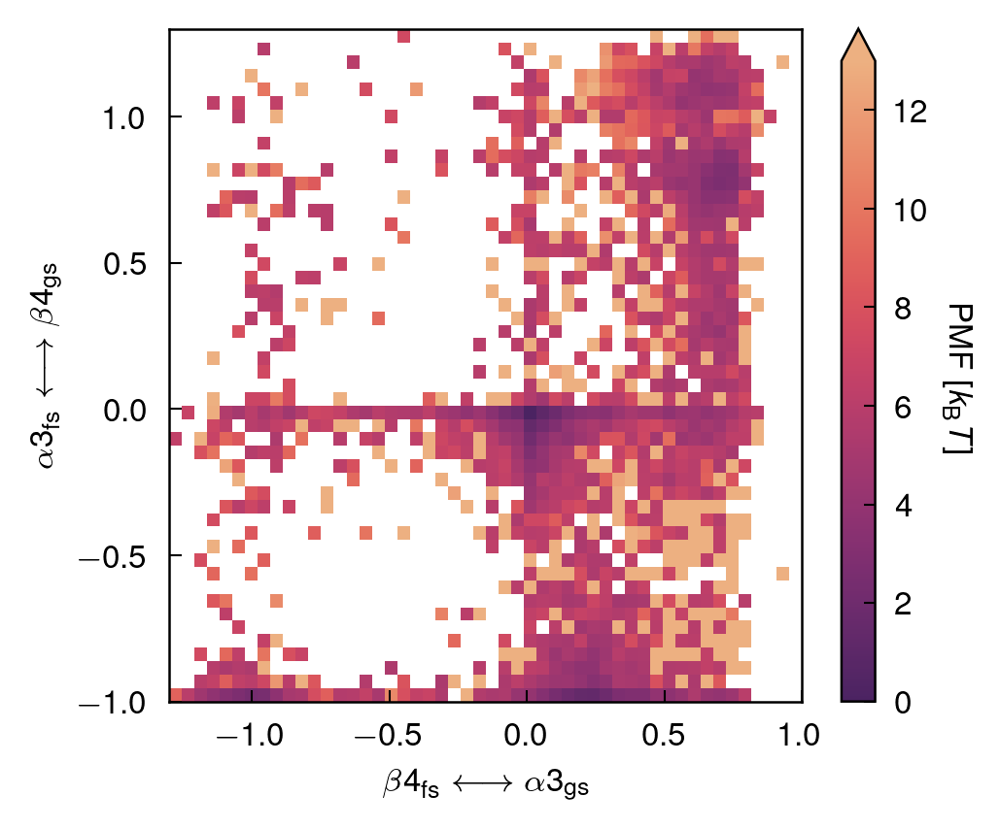

In [103]:
fig, ax = plt.subplots(figsize=(3.5, 3), dpi=300)

xe = np.linspace(-1.3, 1, 51)
ye = np.linspace(-1, 1.3, 51)
xc = (xe[1:] + xe[:-1]) / 2
yc = (ye[1:] + ye[:-1]) / 2
clines = np.arange(0, 13, 2)

green_sampled = np.asarray(c_green)[:, -N::k]
blue_sampled = np.asarray(c_blue)[:, -N::k]

hist, _, _ = np.histogram2d(np.ravel(green_sampled), np.ravel(blue_sampled), weights=np.ravel(weights_sampled), bins=[xe, ye])
offset = np.min(-np.log(hist))
pmf = -np.log(hist) - offset
pc = ax.pcolormesh(xc, yc, pmf.T, vmax=13, cmap="flare_r", rasterized=True)
# ax.contour(xc, yc, pmf.T, colors="white", levels=clines, linewidths=0.5)
ax.set_ylabel(r"$\alpha3_{\mathrm{fs}}\longleftrightarrow \beta4_{\mathrm{gs}}$")
ax.set_xlabel(r"$\beta4_{\mathrm{fs}}\longleftrightarrow\alpha3_{\mathrm{gs}}$")
# ax.set_title(f"$\\tau$ = {lagtime}")
ax.label_outer()
cb = plt.colorbar(pc, ax=ax, extend="max")
cb.set_label(r"PMF [$k_{\mathrm{B}}T$]", rotation=-90, labelpad=10)

/scratch/local/jobs/11579571/ipykernel_1885014/955650203.py:22: RuntimeWarning: divide by zero encountered in log
  offset = np.min(-np.log(hist))
/scratch/local/jobs/11579571/ipykernel_1885014/955650203.py:23: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(hist) - offset


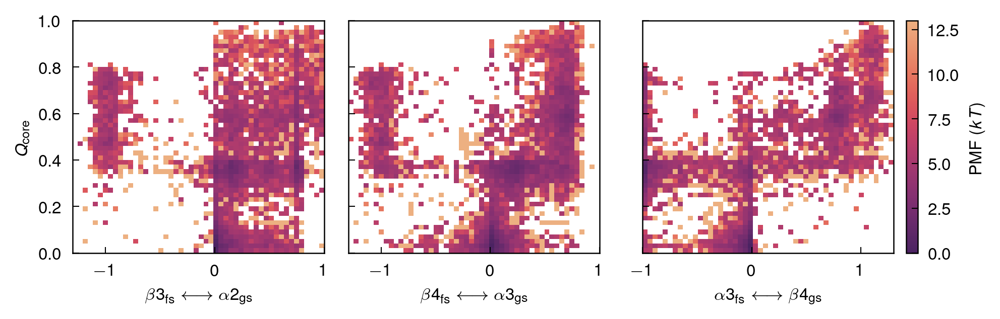

In [104]:
# plot averages of different cvs
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(6.5, 2), dpi=300, constrained_layout=True)

ye = np.linspace(0, 1.0, 51)
yc = (ye[1:] + ye[:-1]) / 2
clines = np.arange(0, 13, 2)

cvs = [c_orange, c_green, c_blue]
labels = [
    r"$\beta3_{\mathrm{fs}}\longleftrightarrow\alpha2_{\mathrm{gs}}$",
    r"$\beta4_{\mathrm{fs}}\longleftrightarrow\alpha3_{\mathrm{gs}}$",
    r"$\alpha3_{\mathrm{fs}}\longleftrightarrow \beta4_{\mathrm{gs}}$",
]
ranges = [(-1.3, 1), (-1.3, 1.0), (-1, 1.3)]
q = np.asarray(q_core)[:, -N::k]

for ax, cv, label, lim in zip(axes, cvs, labels, ranges):
    xe = np.linspace(*lim, 51)
    xc = (xe[1:] + xe[:-1]) / 2
    cv = np.asarray(cv)[:, -N::k]
    hist, _, _ = np.histogram2d(np.ravel(cv), np.ravel(q), weights=np.ravel(weights_sampled), bins=[xe, ye])
    offset = np.min(-np.log(hist))
    pmf = -np.log(hist) - offset
    pc = ax.pcolormesh(xc, yc, pmf.T, vmax=13, cmap="flare_r", rasterized=True)
    # ax.contour(xc, yc, pmf.T, colors="white", levels=clines, linewidths=0.5)
    ax.set_ylabel(r"$Q_{\mathrm{core}}$")
    ax.set_xlabel(label)
    ax.label_outer()
cb = plt.colorbar(pc, ax=axes[-1], label="PMF ($kT$)", location="right")

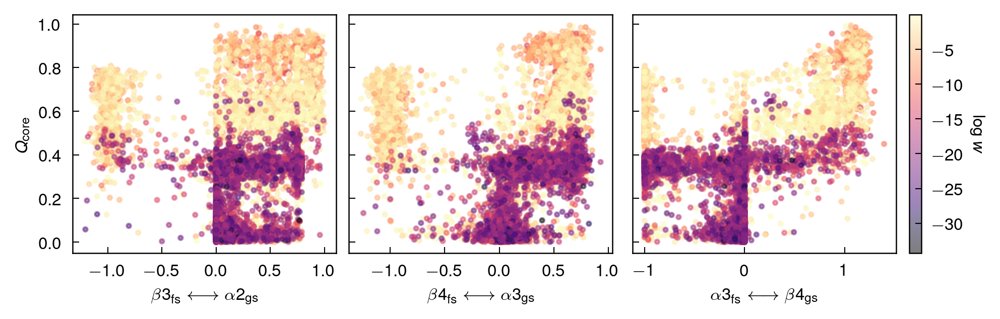

In [105]:
# plot averages of different cvs
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(6.5, 2), dpi=300, constrained_layout=True)

cvs = [c_orange, c_green, c_blue]
labels = [
    r"$\beta3_{\mathrm{fs}}\longleftrightarrow\alpha2_{\mathrm{gs}}$",
    r"$\beta4_{\mathrm{fs}}\longleftrightarrow\alpha3_{\mathrm{gs}}$",
    r"$\alpha3_{\mathrm{fs}}\longleftrightarrow \beta4_{\mathrm{gs}}$",
]
ranges = [(-1.3, 1), (-1.3, 1.0), (-1, 1.3)]
q = np.asarray(q_core)[:, -N::k]

for ax, cv, label, lim in zip(axes, cvs, labels, ranges):
    xe = np.linspace(*lim, 51)
    xc = (xe[1:] + xe[:-1]) / 2
    cv = np.asarray(cv)[:, -N::k]
    sc = ax.scatter(np.ravel(cv), np.ravel(q), c=np.ravel(np.log(weights_sampled)), cmap="magma", alpha=0.5)
    ax.set_ylabel(r"$\alpha3_{\mathrm{fs}}\longleftrightarrow \beta4_{\mathrm{gs}}$")
    ax.set_xlabel(r"$\beta4_{\mathrm{fs}}\longleftrightarrow\alpha3_{\mathrm{gs}}$")
    # ax.contour(xc, yc, pmf.T, colors="white", levels=clines, linewidths=0.5)
    ax.set_ylabel(r"$Q_{\mathrm{core}}$")
    ax.set_xlabel(label)
    ax.label_outer()
cb = plt.colorbar(sc, ax=axes[-1])
cb.set_label(r"$\log w$", rotation=-90, labelpad=10)

/scratch/local/jobs/11579571/ipykernel_1885014/765472218.py:22: RuntimeWarning: divide by zero encountered in log
  offset = np.min(-np.log(hist))
/scratch/local/jobs/11579571/ipykernel_1885014/765472218.py:23: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(hist) - offset


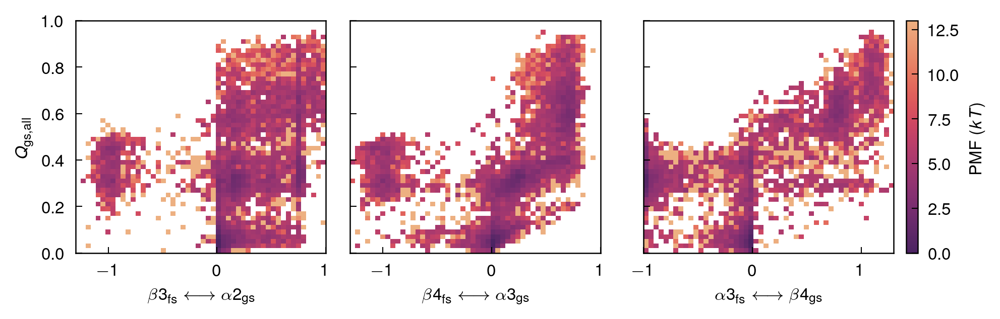

In [106]:
# plot averages of different cvs
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(6.5, 2), dpi=300, constrained_layout=True)

ye = np.linspace(0, 1.0, 51)
yc = (ye[1:] + ye[:-1]) / 2
clines = np.arange(0, 13, 2)

cvs = [c_orange, c_green, c_blue]
labels = [
    r"$\beta3_{\mathrm{fs}}\longleftrightarrow\alpha2_{\mathrm{gs}}$",
    r"$\beta4_{\mathrm{fs}}\longleftrightarrow\alpha3_{\mathrm{gs}}$",
    r"$\alpha3_{\mathrm{fs}}\longleftrightarrow \beta4_{\mathrm{gs}}$",
]
ranges = [(-1.3, 1), (-1.3, 1.0), (-1, 1.3)]
q = np.asarray(q_gs_all)[:, -N::k]

for ax, cv, label, lim in zip(axes, cvs, labels, ranges):
    xe = np.linspace(*lim, 51)
    xc = (xe[1:] + xe[:-1]) / 2
    cv = np.asarray(cv)[:, -N::k]
    hist, _, _ = np.histogram2d(np.ravel(cv), np.ravel(q), weights=np.ravel(weights_sampled), bins=[xe, ye])
    offset = np.min(-np.log(hist))
    pmf = -np.log(hist) - offset
    pc = ax.pcolormesh(xc, yc, pmf.T, vmax=13, cmap="flare_r", rasterized=True)
    # ax.contour(xc, yc, pmf.T, colors="white", levels=clines, linewidths=0.5)
    ax.set_ylabel(r"$Q_{\mathrm{gs, all}}$")
    ax.set_xlabel(label)
    ax.label_outer()
cb = plt.colorbar(pc, ax=axes[-1], label="PMF ($kT$)", location="right")

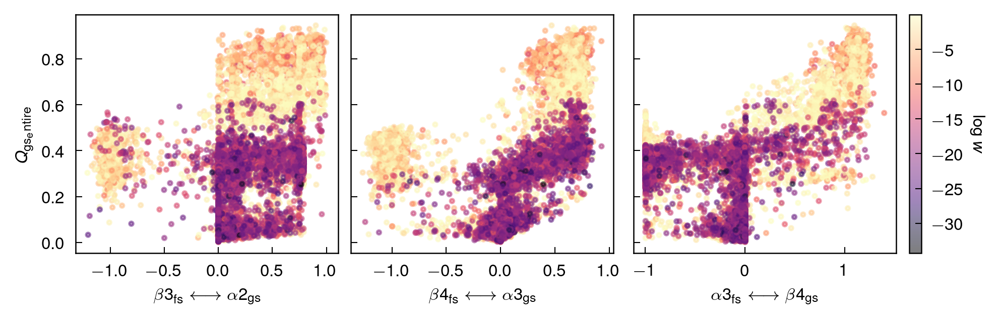

In [107]:
# plot averages of different cvs
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(6.5, 2), dpi=300, constrained_layout=True)

cvs = [c_orange, c_green, c_blue]
labels = [
    r"$\beta3_{\mathrm{fs}}\longleftrightarrow\alpha2_{\mathrm{gs}}$",
    r"$\beta4_{\mathrm{fs}}\longleftrightarrow\alpha3_{\mathrm{gs}}$",
    r"$\alpha3_{\mathrm{fs}}\longleftrightarrow \beta4_{\mathrm{gs}}$",
]
ranges = [(-1.3, 1), (-1.3, 1.0), (-1, 1.3)]
q = np.asarray(q_gs_all)[:, -N::k]

for ax, cv, label, lim in zip(axes, cvs, labels, ranges):
    xe = np.linspace(*lim, 51)
    xc = (xe[1:] + xe[:-1]) / 2
    cv = np.asarray(cv)[:, -N::k]
    sc = ax.scatter(np.ravel(cv), np.ravel(q), c=np.ravel(np.log(weights_sampled)), cmap="magma", alpha=0.5)
    ax.set_ylabel(r"$\alpha3_{\mathrm{fs}}\longleftrightarrow \beta4_{\mathrm{gs}}$")
    ax.set_xlabel(r"$\beta4_{\mathrm{fs}}\longleftrightarrow\alpha3_{\mathrm{gs}}$")
    # ax.contour(xc, yc, pmf.T, colors="white", levels=clines, linewidths=0.5)
    ax.set_ylabel(r"$Q_{\mathrm{gs_entire}}$")
    ax.set_xlabel(label)
    ax.label_outer()
cb = plt.colorbar(sc, ax=axes[-1])
cb.set_label(r"$\log w$", rotation=-90, labelpad=10)

/scratch/local/jobs/11579571/ipykernel_1885014/1807802959.py:22: RuntimeWarning: divide by zero encountered in log
  offset = np.min(-np.log(hist))
/scratch/local/jobs/11579571/ipykernel_1885014/1807802959.py:23: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(hist) - offset


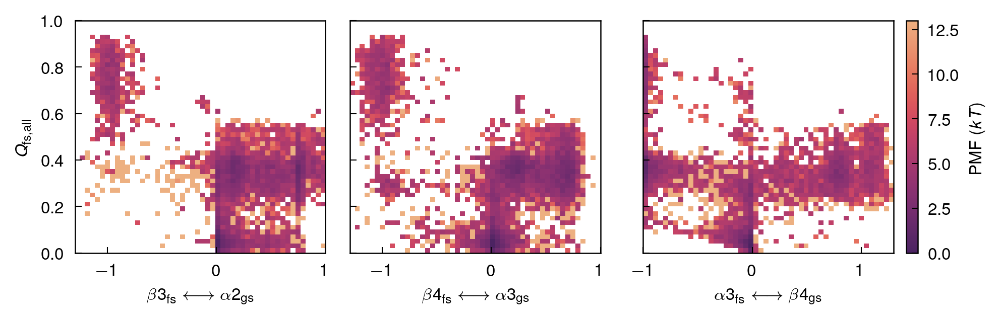

In [108]:
# plot averages of different cvs
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(6.5, 2), dpi=300, constrained_layout=True)

ye = np.linspace(0, 1.0, 51)
yc = (ye[1:] + ye[:-1]) / 2
clines = np.arange(0, 13, 2)

cvs = [c_orange, c_green, c_blue]
labels = [
    r"$\beta3_{\mathrm{fs}}\longleftrightarrow\alpha2_{\mathrm{gs}}$",
    r"$\beta4_{\mathrm{fs}}\longleftrightarrow\alpha3_{\mathrm{gs}}$",
    r"$\alpha3_{\mathrm{fs}}\longleftrightarrow \beta4_{\mathrm{gs}}$",
]
ranges = [(-1.3, 1), (-1.3, 1.0), (-1, 1.3)]
q = np.asarray(q_fs_all)[:, -N::k]

for ax, cv, label, lim in zip(axes, cvs, labels, ranges):
    xe = np.linspace(*lim, 51)
    xc = (xe[1:] + xe[:-1]) / 2
    cv = np.asarray(cv)[:, -N::k]
    hist, _, _ = np.histogram2d(np.ravel(cv), np.ravel(q), weights=np.ravel(weights_sampled), bins=[xe, ye])
    offset = np.min(-np.log(hist))
    pmf = -np.log(hist) - offset
    pc = ax.pcolormesh(xc, yc, pmf.T, vmax=13, cmap="flare_r", rasterized=True)
    # ax.contour(xc, yc, pmf.T, colors="white", levels=clines, linewidths=0.5)
    ax.set_ylabel(r"$Q_{\mathrm{fs, all}}$")
    ax.set_xlabel(label)
    ax.label_outer()
cb = plt.colorbar(pc, ax=axes[-1], label="PMF ($kT$)", location="right")

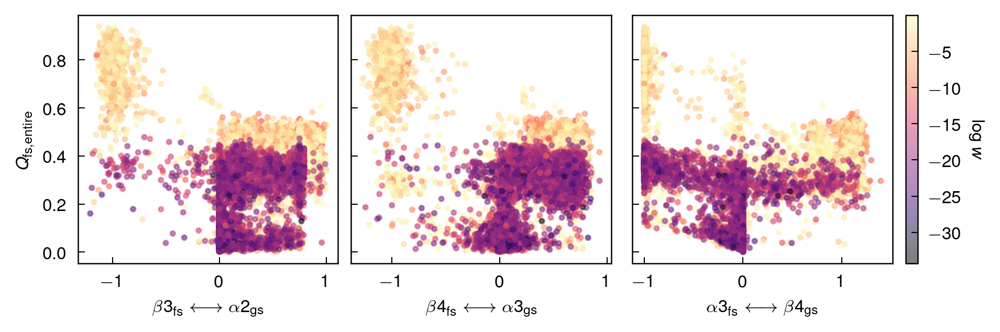

In [109]:
# plot averages of different cvs
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(6.25, 2), dpi=300, constrained_layout=True)

cvs = [c_orange, c_green, c_blue]
labels = [
    r"$\beta3_{\mathrm{fs}}\longleftrightarrow\alpha2_{\mathrm{gs}}$",
    r"$\beta4_{\mathrm{fs}}\longleftrightarrow\alpha3_{\mathrm{gs}}$",
    r"$\alpha3_{\mathrm{fs}}\longleftrightarrow \beta4_{\mathrm{gs}}$",
]
ranges = [(-1.3, 1), (-1.3, 1.0), (-1, 1.3)]
q = np.asarray(q_fs_all)[:, -N::k]

for ax, cv, label, lim in zip(axes, cvs, labels, ranges):
    xe = np.linspace(*lim, 51)
    xc = (xe[1:] + xe[:-1]) / 2
    cv = np.asarray(cv)[:, -N::k]
    sc = ax.scatter(np.ravel(cv), np.ravel(q), c=np.ravel(np.log(weights_sampled)), cmap="magma", alpha=0.5)
    ax.set_ylabel(r"$\alpha3_{\mathrm{fs}}\longleftrightarrow \beta4_{\mathrm{gs}}$")
    ax.set_xlabel(r"$\beta4_{\mathrm{fs}}\longleftrightarrow\alpha3_{\mathrm{gs}}$")
    # ax.contour(xc, yc, pmf.T, colors="white", levels=clines, linewidths=0.5)
    ax.set_ylabel(r"$Q_{\mathrm{fs,entire}}$")
    ax.set_xlabel(label)
    ax.label_outer()
cb = plt.colorbar(sc, ax=axes[-1])
cb.set_label(r"$\log w$", rotation=-90, labelpad=10)

# initialize more trajectories

In [ ]:
fs_qtots_0 = np.load(f"{work_dir}/{output_dirs[3]}/outputs/{heads[3]}_fs_qtots.pkl", allow_pickle=True)
c_green_0 = [traj[3, :] - traj[2, :] for traj in fs_qtots_0]
c_blue_0 = [traj[5, :] - traj[4, :] for traj in fs_qtots_0]
c_orange_0 = [traj[1, :] - traj[0, :] for traj in fs_qtots_0]

In [ ]:
fig, ax = plt.subplots(figsize=(3.5, 3), dpi=300)

xe = np.linspace(-1.3, 1, 101)
ye = np.linspace(-1, 1.3, 101)
xc = (xe[1:] + xe[:-1]) / 2
yc = (ye[1:] + ye[:-1]) / 2
clines = np.arange(0, 13, 2)

cv1_delay = [t for t in c_green]
cv2_delay = [t for t in c_blue]

hist = extq.projection.density2d(cv1_delay, cv2_delay, w_nb, xe, ye)
offset = np.min(-np.log(hist))
pmf = -np.log(hist) - offset

pc = ax.pcolormesh(xc, yc, pmf.T, vmax=13, cmap="flare_r", rasterized=True)
ax.contour(xc, yc, pmf.T, colors="white", levels=clines, linewidths=0.5, alpha=0.5)
plt.plot(c_green_0[1][:100], c_blue_0[1][:100])
ax.set_ylabel(r"$\alpha3_{\mathrm{fs}}\longleftrightarrow \beta4_{\mathrm{gs}}$")
ax.set_xlabel(r"$\beta4_{\mathrm{fs}}\longleftrightarrow\alpha3_{\mathrm{gs}}$")
# ax.set_title(f"$\\tau$ = {lagtime}")
ax.label_outer()
cb = plt.colorbar(pc, ax=ax, extend="max")
cb.set_label(r"PMF [$k_{\mathrm{B}}T$]", rotation=-90, labelpad=10)

In [ ]:
def find_closest_points(point, data, n=1):
    """Find ID of closest point(s) in data to point
    point must be of the same dimensionality as data, i.e.
    point.shape = d, data.shape = (N, d) where N in the number
    of data points

    Parameters
    ----------
    point : array-like of length d
        point to which to find closest values
    data : array-like of shape (N, d)
        data to search
    n : int, optional
        number of indices to return

    Returns
    -------
    indices : array-like of length n
    """
    assert len(point) == data.shape[1]
    distances = np.sum((data - point) ** 2, axis=1)
    return np.argsort(distances)[:n]

In [ ]:
c_gb = np.stack((np.concatenate(c_green_0), np.concatenate(c_blue_0)), axis=-1)
print(np.array(c_green_0).shape)
idx = find_closest_points([-1, 1], c_gb)
print(divmod(idx, 43456))

In [ ]:
import mdtraj_upside as mu

In [ ]:
frame = md.load_frame(f"{work_dir}/{output_dirs[3]}/{output_names[3]}.run.23.h5", 34423)
frame.save_pdb(f"/project/dinner/scguo/kaiB/pdb/remd_{output_names[3]}_23_34423.pdb")

In [ ]:
idx = find_closest_points([0.7, -1], c_gb)
print(divmod(idx, 43456))

In [ ]:
frame = md.load_frame(f"{work_dir}/{output_dirs[3]}/{output_names[3]}.run.19.h5", 42383)
frame.save_pdb(f"/project/dinner/scguo/kaiB/pdb/remd_{output_names[3]}_19_42383.pdb")

In [ ]:
c_bo = np.stack((np.concatenate(c_blue_0), np.concatenate(c_orange_0)), axis=-1)
idx = find_closest_points([1, -1], c_bo)
print(divmod(idx, 43456))

In [ ]:
frame = md.load_frame(f"{work_dir}/{output_dirs[3]}/{output_names[3]}.run.21.h5", 33547)
frame.save_pdb(f"/project/dinner/scguo/kaiB/pdb/remd_{output_names[3]}_21_33547.pdb")

In [ ]:
c_go = np.stack((np.concatenate(c_green_0), np.concatenate(c_orange_0)), axis=-1)
idx = find_closest_points([-1, 0.8], c_go)
print(divmod(idx, 43456))

In [ ]:
frame = md.load_frame(f"{work_dir}/{output_dirs[3]}/{output_names[3]}.run.25.h5", 30869)
frame.save_pdb(f"/project/dinner/scguo/kaiB/pdb/remd_{output_names[3]}_25_30869.pdb")